In [1]:
import networkx as nx

import matplotlib.pyplot as plt 
%matplotlib inline 

import matplotlib.colors as mcolors
import seaborn as sns

In [2]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=100, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1))
    
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [3]:
def average(lst):
    return sum(lst) / len(lst)

# Directed Graph creation

In [4]:
edges = []
with open("email-Eu-core.txt", "r") as f:
    for line in f:
        s = line.strip()
        u, v = s.split(" ")
        if(int(u) != int(v)):      #to pick only edges between different people
            edges.append((int(u), int(v)))

In [5]:
direct_G = nx.DiGraph()
direct_G.add_edges_from(edges)

In [6]:
print(len(direct_G.nodes))
print(len(direct_G.edges))

986
24929


In [7]:
pos = nx.spring_layout(direct_G)

In [8]:
#plt.figure(figsize=(12,8))
#nx.draw_networkx(direct_G, pos, node_size = 30, with_labels = False)
#plt.show()

In [37]:
#print("Eccentricity: ", nx.eccentricity(direct_G)) 
#print("Diameter: ", nx.diameter(direct_G)) 
#print("Radius: ", nx.radius(direct_G)) 
#print("Periphery: ", list(nx.periphery(direct_G))) 
#print("Center: ", list(nx.center(direct_G))) 

#--> NetworkXError: Found infinite path length because the digraph is not strongly connected

NetworkXError: Found infinite path length because the digraph is not strongly connected

# Connectivity Analysis

In [10]:
#print(nx.number_connected_components(direct_G))  #--> NetworkXNotImplemented: not implemented for directed type

In [11]:
print(nx.is_weakly_connected(direct_G)) #Test directed graph for weak connectivity. A directed graph is weakly connected if, and only if, the graph is connected when the direction of the edge between nodes is ignored.
print(nx.number_weakly_connected_components(direct_G))

True
1


In [12]:
print(nx.is_strongly_connected(direct_G))
nx.number_strongly_connected_components(direct_G) #Return number of strongly connected components in graph. For directed graphs only.

False


184

In [13]:
lsi = nx.strongly_connected_components(direct_G)
print(list(lsi))

[{1}, {468}, {402}, {203}, {505}, {656}, {130}, {561}, {701}, {289}, {682}, {319}, {583}, {688}, {680}, {78}, {628}, {785}, {764}, {677}, {532}, {630}, {586}, {762}, {605}, {575}, {771}, {571}, {625}, {749}, {965}, {987}, {576}, {782}, {757}, {986}, {804}, {729}, {967}, {775}, {724}, {439}, {862}, {702}, {472}, {227}, {315}, {893}, {973}, {975}, {805}, {767}, {984}, {1002}, {386}, {972}, {436}, {997}, {993}, {807}, {683}, {884}, {888}, {849}, {639}, {876}, {854}, {850}, {848}, {780}, {752}, {594}, {934}, {449}, {603}, {479}, {916}, {722}, {604}, {384}, {946}, {769}, {831}, {718}, {774}, {646}, {784}, {864}, {988}, {867}, {977}, {239}, {676}, {819}, {794}, {796}, {578}, {983}, {897}, {795}, {968}, {911}, {781}, {861}, {584}, {709}, {687}, {626}, {857}, {622}, {637}, {631}, {693}, {475}, {739}, {940}, {873}, {874}, {870}, {574}, {964}, {894}, {994}, {868}, {801}, {881}, {842}, {915}, {830}, {853}, {792}, {890}, {383}, {382}, {398}, {966}, {882}, {712}, {910}, {998}, {827}, {787}, {606}, 

In [14]:
largest = max(nx.strongly_connected_components(direct_G), key=len)
#print(largest)
print(type(largest))
DG_strong = direct_G.subgraph(largest)
print(DG_strong.edges())

<class 'set'>
[(0, 316), (0, 146), (0, 268), (0, 581), (0, 221), (0, 18), (0, 734), (0, 178), (0, 380), (0, 459), (0, 215), (0, 250), (0, 148), (0, 73), (0, 498), (0, 226), (0, 101), (0, 218), (0, 377), (0, 17), (0, 74), (0, 177), (0, 248), (0, 103), (0, 560), (0, 309), (0, 88), (0, 5), (0, 297), (0, 313), (0, 223), (0, 238), (0, 368), (0, 266), (0, 222), (0, 283), (0, 6), (0, 64), (0, 166), (2, 3), (2, 4), (2, 195), (2, 305), (2, 412), (2, 102), (2, 194), (2, 55), (2, 252), (2, 13), (2, 63), (2, 192), (2, 408), (2, 138), (2, 434), (2, 6), (2, 281), (2, 193), (2, 174), (2, 285), (2, 137), (2, 323), (2, 211), (2, 58), (2, 238), (2, 520), (2, 481), (2, 665), (2, 59), (2, 208), (2, 5), (2, 506), (2, 516), (2, 517), (2, 160), (2, 286), (2, 57), (2, 132), (2, 409), (2, 411), (2, 587), (2, 140), (2, 96), (2, 64), (2, 809), (2, 826), (2, 158), (2, 738), (2, 832), (2, 273), (2, 803), (2, 845), (2, 89), (2, 54), (2, 300), (2, 489), (2, 612), (2, 249), (2, 865), (2, 283), (2, 107), (2, 880), (2,

In [15]:
print(len(DG_strong.nodes))
print(len(DG_strong.edges))

803
24138


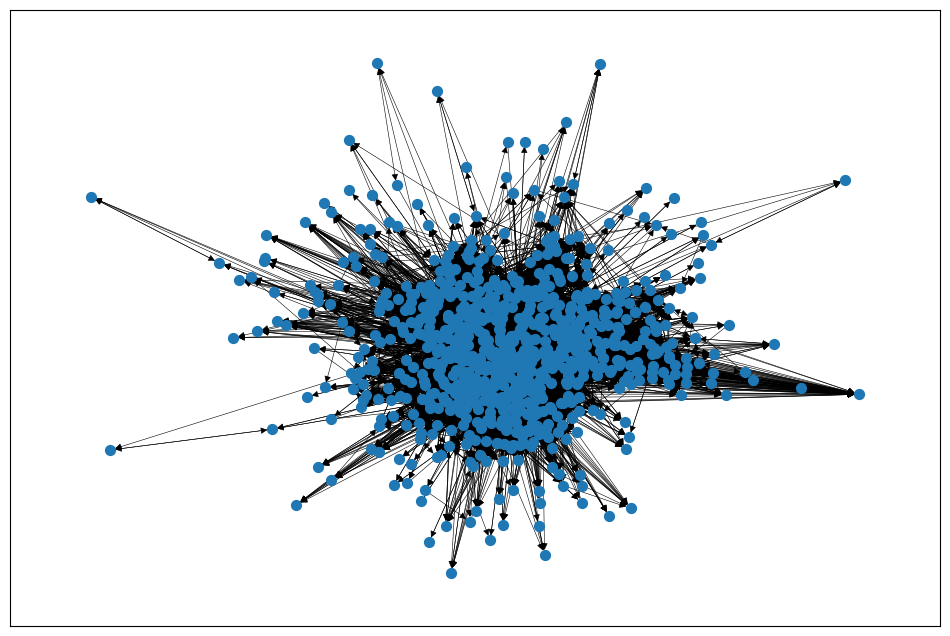

In [61]:
pos = nx.spring_layout(DG_strong)
plt.figure(figsize=(12,8))
#nx.draw(DG_strong, pos)
nx.draw_networkx(DG_strong, pos, node_size = 50, with_labels = False, width = 0.4)
plt.show()

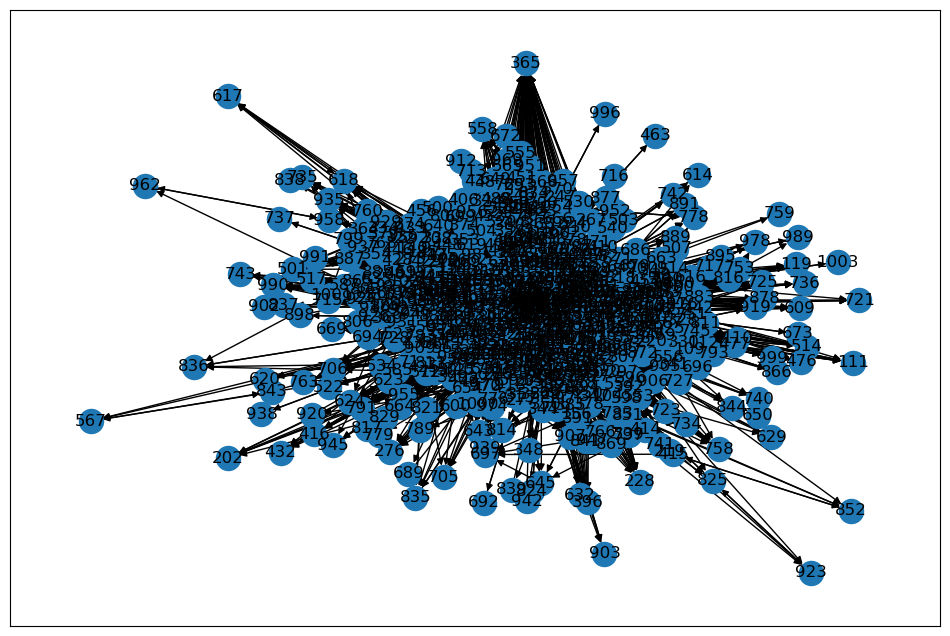

In [43]:
pos = nx.spring_layout(DG_strong)
plt.figure(figsize=(12,8))
nx.draw_networkx(DG_strong, pos)
plt.show()
#NB: node 365!

In [16]:
print(nx.is_weakly_connected(DG_strong)) #True
print(nx.number_weakly_connected_components(DG_strong)) #1
print(nx.is_strongly_connected(DG_strong)) #True
print(nx.number_strongly_connected_components(DG_strong)) #1

True
1
True
1


# Metrics

In [45]:
print("Eccentricity: ", nx.eccentricity(DG_strong)) 
print("Diameter: ", nx.diameter(DG_strong)) 
print("Radius: ", nx.radius(DG_strong)) 
print("Periphery: ", list(nx.periphery(DG_strong))) 
print("Center: ", list(nx.center(DG_strong))) 
print("Is directed: ", nx.is_directed(DG_strong)) 

print("Average clustering Coefficient: ", nx.average_clustering(DG_strong))
print("Density: ", nx.density(DG_strong))


Eccentricity:  {0: 4, 2: 4, 3: 4, 4: 4, 5: 3, 6: 3, 7: 4, 8: 4, 9: 4, 10: 4, 11: 4, 12: 4, 13: 3, 14: 4, 15: 4, 16: 4, 17: 3, 18: 4, 19: 4, 20: 4, 21: 3, 22: 4, 23: 3, 24: 4, 25: 4, 26: 4, 27: 4, 28: 4, 29: 4, 30: 4, 31: 4, 32: 4, 33: 4, 34: 4, 35: 4, 36: 4, 37: 4, 38: 4, 39: 4, 40: 4, 41: 4, 42: 4, 43: 4, 44: 3, 45: 4, 46: 4, 47: 4, 48: 4, 49: 4, 50: 4, 51: 4, 52: 4, 53: 4, 54: 4, 55: 4, 56: 4, 57: 4, 58: 3, 59: 4, 60: 4, 61: 4, 62: 4, 63: 4, 64: 3, 65: 4, 66: 4, 67: 4, 68: 4, 69: 4, 70: 4, 71: 4, 72: 4, 73: 4, 74: 4, 75: 4, 76: 4, 77: 4, 79: 4, 80: 4, 81: 4, 82: 3, 83: 3, 84: 3, 85: 4, 86: 3, 87: 3, 88: 4, 89: 4, 90: 4, 91: 4, 92: 4, 93: 4, 94: 4, 95: 4, 96: 4, 97: 4, 98: 4, 99: 4, 100: 4, 101: 4, 102: 4, 103: 4, 104: 4, 105: 3, 106: 4, 107: 4, 108: 4, 109: 4, 110: 4, 111: 5, 112: 4, 113: 4, 114: 4, 115: 4, 116: 4, 117: 4, 118: 4, 119: 4, 120: 4, 121: 3, 122: 4, 123: 4, 124: 4, 125: 4, 126: 4, 127: 4, 128: 3, 129: 3, 131: 4, 132: 4, 133: 4, 134: 4, 135: 4, 136: 4, 137: 4, 138: 4, 139

In [42]:
degrees = DG_strong.degree()
#print(degrees)
#print(dict(degrees))
sum_of_edges = sum(dict(degrees).values())
mean_degree = sum_of_edges/(len(DG_strong.nodes))
print(mean_degree)

60.11955168119552


In [43]:
indegrees = DG_strong.in_degree()
#print(degrees)
#print(dict(indegrees))
sum_of_edges1 = sum(dict(indegrees).values())
mean_indegree = sum_of_edges1/(len(DG_strong.nodes))
print(mean_degree)

60.11955168119552


In [44]:
outdegrees = DG_strong.out_degree()
#print(degrees)
#print(dict(outdegrees))
sum_of_edges2 = sum(dict(outdegrees).values())
mean_outdegree = sum_of_edges2/(len(DG_strong.nodes))
print(mean_degree)

60.11955168119552


In [16]:
DG_strong.in_degree

InDegreeView({0: 31, 2: 76, 3: 61, 4: 73, 5: 123, 6: 92, 7: 48, 8: 33, 9: 26, 10: 41, 11: 61, 12: 45, 13: 60, 14: 54, 15: 44, 16: 68, 17: 60, 18: 45, 19: 61, 20: 63, 21: 110, 22: 12, 23: 67, 24: 25, 25: 32, 26: 29, 27: 50, 28: 95, 29: 47, 30: 54, 31: 38, 32: 31, 33: 23, 34: 22, 35: 52, 36: 42, 37: 21, 38: 28, 39: 32, 40: 47, 41: 65, 42: 49, 43: 10, 44: 91, 45: 37, 46: 67, 47: 46, 48: 45, 49: 12, 50: 14, 51: 61, 52: 17, 53: 27, 54: 41, 55: 34, 56: 38, 57: 52, 58: 102, 59: 45, 60: 38, 61: 54, 62: 178, 63: 103, 64: 135, 65: 39, 66: 19, 67: 8, 68: 38, 69: 40, 70: 16, 71: 14, 72: 5, 73: 24, 74: 75, 75: 13, 76: 21, 77: 18, 79: 34, 80: 60, 81: 91, 82: 120, 83: 85, 84: 47, 85: 34, 86: 153, 87: 108, 88: 28, 89: 56, 90: 23, 91: 26, 92: 37, 93: 50, 94: 36, 95: 36, 96: 96, 97: 20, 98: 22, 99: 22, 100: 35, 101: 24, 102: 15, 103: 42, 104: 31, 105: 114, 106: 126, 107: 168, 108: 36, 109: 4, 110: 8, 111: 8, 112: 16, 113: 73, 114: 108, 115: 100, 116: 67, 117: 14, 118: 23, 119: 13, 120: 13, 121: 156, 122

In [17]:
DG_strong.out_degree

OutDegreeView({0: 39, 2: 80, 3: 53, 4: 82, 5: 152, 6: 106, 7: 66, 8: 27, 9: 32, 10: 34, 11: 70, 12: 48, 13: 164, 14: 69, 15: 36, 16: 46, 17: 101, 18: 41, 19: 57, 20: 53, 21: 125, 22: 13, 23: 61, 24: 33, 25: 18, 26: 22, 27: 42, 28: 76, 29: 44, 30: 55, 31: 42, 32: 22, 33: 18, 34: 25, 35: 43, 36: 19, 37: 31, 38: 38, 39: 15, 40: 51, 41: 71, 42: 66, 43: 6, 44: 79, 45: 37, 46: 48, 47: 36, 48: 50, 49: 9, 50: 11, 51: 47, 52: 20, 53: 31, 54: 45, 55: 33, 56: 38, 57: 55, 58: 113, 59: 42, 60: 50, 61: 62, 62: 182, 63: 105, 64: 111, 65: 75, 66: 24, 67: 7, 68: 39, 69: 59, 70: 12, 71: 13, 72: 6, 73: 28, 74: 77, 75: 17, 76: 14, 77: 16, 79: 33, 80: 56, 81: 87, 82: 211, 83: 114, 84: 124, 85: 26, 86: 197, 87: 122, 88: 19, 89: 52, 90: 21, 91: 28, 92: 38, 93: 72, 94: 33, 95: 38, 96: 101, 97: 23, 98: 16, 99: 18, 100: 36, 101: 20, 102: 20, 103: 32, 104: 15, 105: 115, 106: 99, 107: 194, 108: 36, 109: 4, 110: 5, 111: 1, 112: 7, 113: 70, 114: 123, 115: 108, 116: 67, 117: 12, 118: 28, 119: 1, 120: 13, 121: 209, 1

In [17]:
print(nx.average_degree_connectivity(DG_strong, source='in+out', target='in+out', nodes=None, weight=None))

{70: 50.32857142857143, 156: 58.80769230769231, 114: 53.46140350877193, 155: 70.03870967741935, 275: 50.32, 198: 56.686868686868685, 60: 57.35, 58: 49.16858237547893, 75: 59.52333333333333, 131: 47.10687022900763, 93: 57.21290322580645, 224: 63.86607142857143, 123: 55.09756097560975, 80: 62.2675, 161: 68.48757763975155, 86: 62.53953488372093, 118: 66.28389830508475, 116: 57.508620689655174, 235: 68.82553191489362, 25: 47.06153846153846, 128: 65.875, 50: 46.06666666666667, 51: 52.490196078431374, 92: 66.83967391304348, 171: 65.68128654970761, 91: 58.07692307692308, 109: 68.84862385321101, 53: 38.16981132075472, 41: 51.073170731707314, 47: 57.91702127659575, 95: 58.034586466165415, 61: 46.067622950819676, 52: 50.43269230769231, 66: 55.36969696969697, 98: 46.66326530612245, 136: 70.75735294117646, 115: 59.958695652173915, 16: 53.56875, 170: 55.86470588235294, 74: 49.820945945945944, 82: 62.84959349593496, 21: 51.265306122448976, 108: 70.36481481481482, 37: 44.31351351351351, 67: 59.139303

# Visualizations

In [18]:
#Spring_layout -> see above

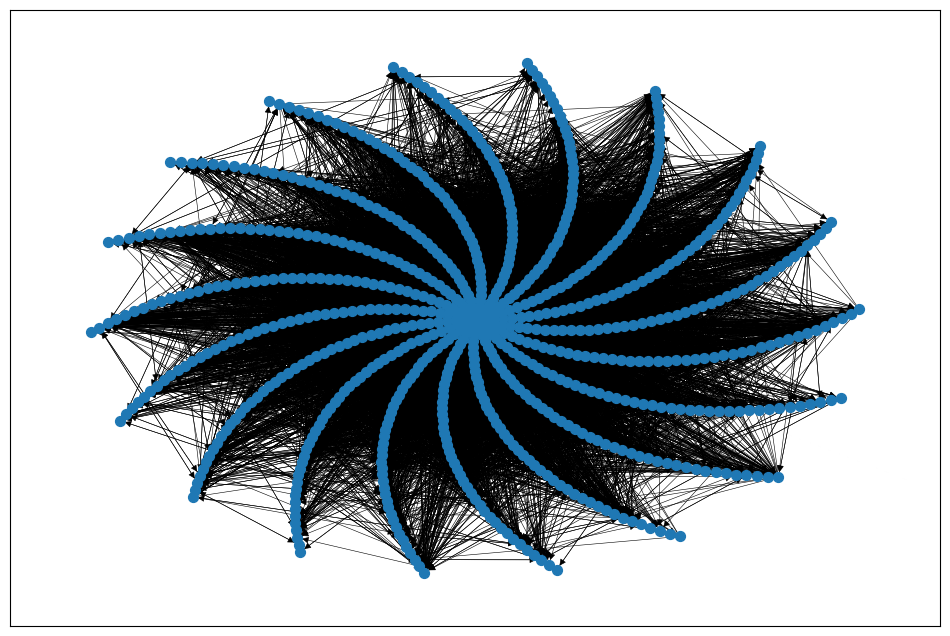

In [65]:
pos2 = nx.spiral_layout(DG_strong)
plt.figure(figsize=(12,8))
nx.draw_networkx(DG_strong, pos2, node_size = 50, with_labels = False, width = 0.4)
#nx.draw(DG_strong, pos)

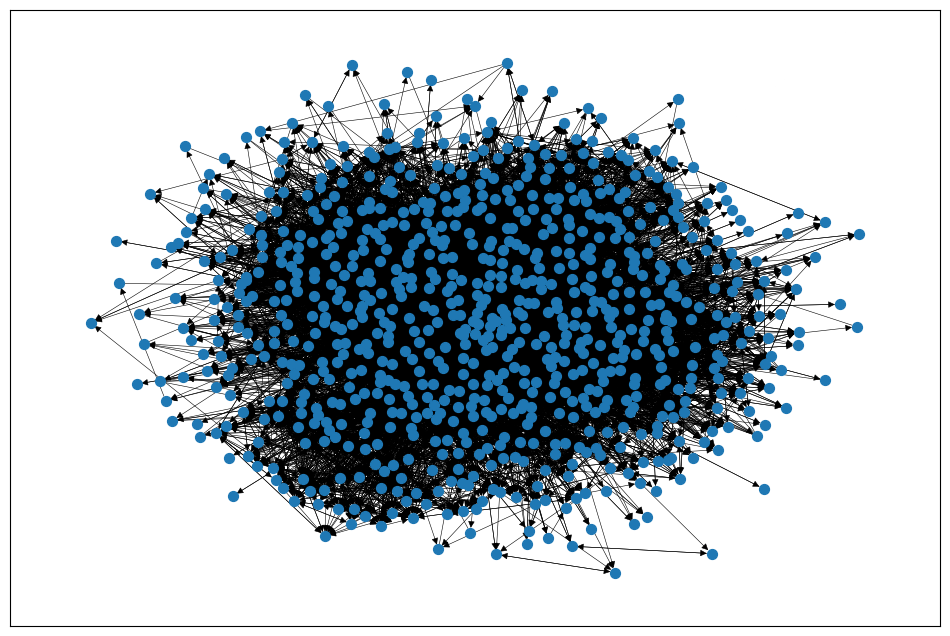

In [66]:
pos3 = nx.kamada_kawai_layout(DG_strong)
plt.figure(figsize=(12,8))
nx.draw_networkx(DG_strong, pos3, node_size = 50, with_labels = False, width = 0.4)
#nx.draw(DG_strong, pos)
plt.show()

In [19]:
#fruchterman_reingold_layout #similar to spring layout 

# Centrality Analysis

## Degree Centrality

0.07496203451520664


<Figure size 1500x1000 with 0 Axes>

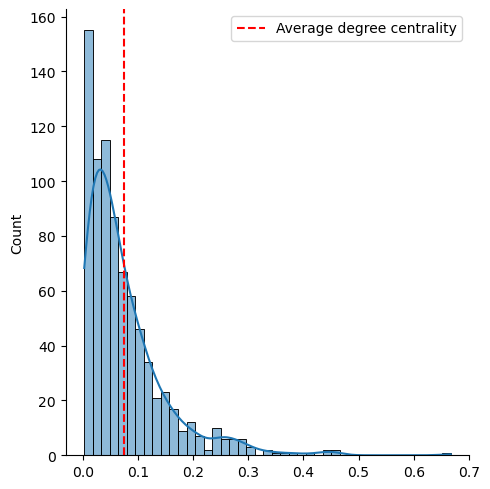

In [49]:
degree_centr_TOT = nx.degree_centrality(DG_strong) 

from matplotlib.lines import Line2D

print(average(list(degree_centr_TOT.values())))
plt.figure(figsize=(15,10))
sns.displot(list(degree_centr_TOT.values()), kde=True)
plt.axvline(average(list(degree_centr_TOT.values())), color='red', ls='--')

line = [Line2D([0], [0], color='red', linestyle='--')]

labels = ["Average degree centrality"]
plt.legend(line, labels)
plt.show()

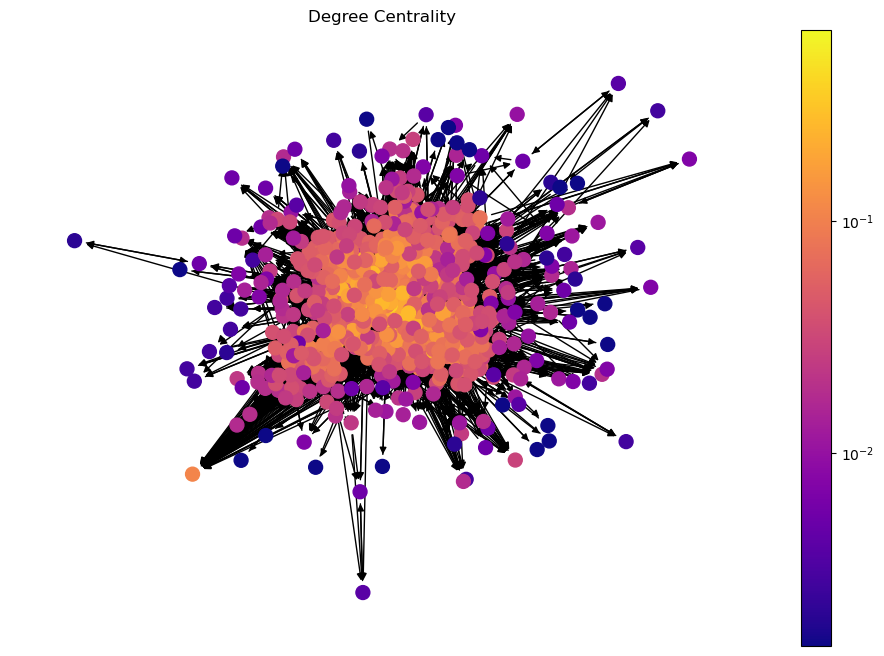

In [50]:
plt.figure(figsize=(12,8))
pos = nx.spring_layout(DG_strong)
draw(DG_strong, pos, degree_centr_TOT,  'Degree Centrality')

In [51]:
degree_centr_TOT_sorted=dict(sorted(degree_centr_TOT.items(), key=lambda item: item[1],reverse=True))
print(type(degree_centr_TOT_sorted))
print(degree_centr_TOT_sorted) 

<class 'dict'>
{160: 0.6670822942643392, 121: 0.45511221945137154, 107: 0.4513715710723192, 62: 0.44887780548628425, 86: 0.4364089775561097, 82: 0.41271820448877805, 434: 0.3790523690773067, 183: 0.371571072319202, 5: 0.3428927680798005, 129: 0.3341645885286783, 249: 0.3341645885286783, 211: 0.3092269326683292, 166: 0.3079800498753117, 64: 0.30673316708229426, 128: 0.2942643391521197, 21: 0.29301745635910226, 283: 0.29052369077306733, 114: 0.2880299251870324, 87: 0.286783042394015, 105: 0.2855361596009975, 106: 0.2805486284289277, 13: 0.2793017456359102, 282: 0.27556109725685785, 58: 0.26807980049875313, 333: 0.26807980049875313, 142: 0.26683291770573564, 420: 0.2643391521197007, 820: 0.2630922693266833, 63: 0.2593516209476309, 115: 0.2593516209476309, 533: 0.25810473815461343, 212: 0.256857855361596, 301: 0.24937655860349126, 424: 0.24937655860349126, 83: 0.24812967581047382, 6: 0.24688279301745636, 169: 0.24688279301745636, 377: 0.24688279301745636, 96: 0.2456359102244389, 165: 0.238

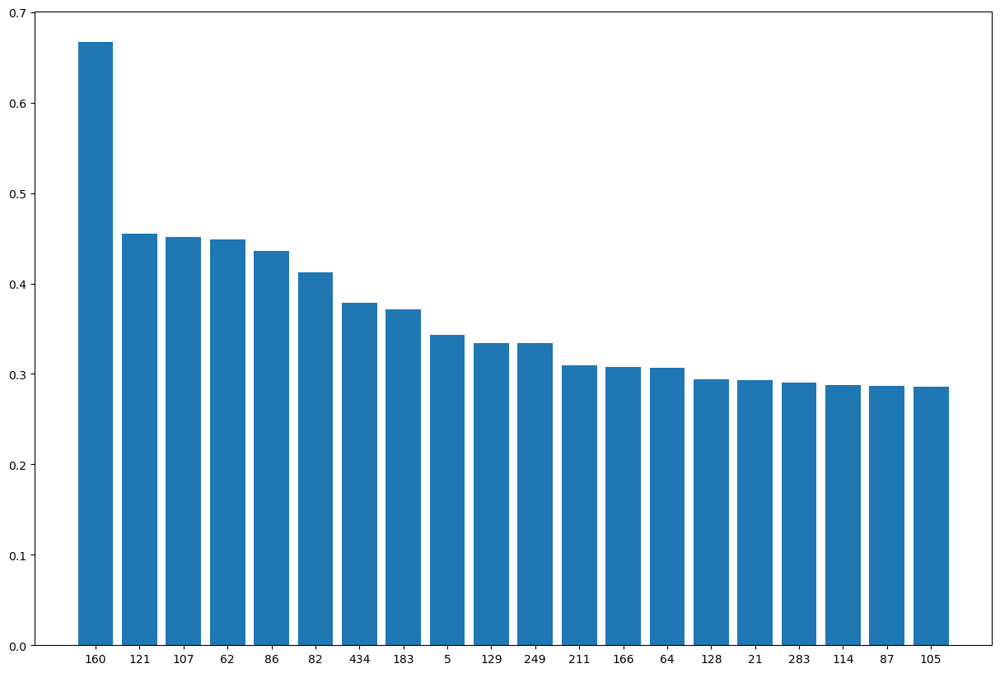

In [52]:
import itertools

sub_dict_tot_DC = dict(itertools.islice(degree_centr_TOT_sorted.items(), 20))

plt.figure(figsize=(15,10))
plt.bar(range(len(sub_dict_tot_DC)), list(sub_dict_tot_DC.values()), align='center') 
plt.xticks(range(len(sub_dict_tot_DC)), list(sub_dict_tot_DC.keys()))
plt.show()

## in_degree_centrality

0.037481017257603486


<Figure size 1500x1000 with 0 Axes>

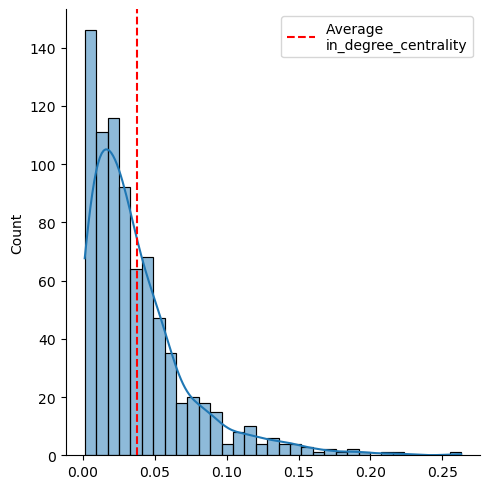

In [22]:
in_degree_centr = nx.in_degree_centrality(DG_strong) 

from matplotlib.lines import Line2D

print(average(list(in_degree_centr.values())))
plt.figure(figsize=(15,10))
sns.displot(list(in_degree_centr.values()), kde=True)
plt.axvline(average(list(in_degree_centr.values())), color='red', ls='--')

line = [Line2D([0], [0], color='red', linestyle='--')]

labels = ["Average \nin_degree_centrality"]
plt.legend(line, labels)
plt.show()

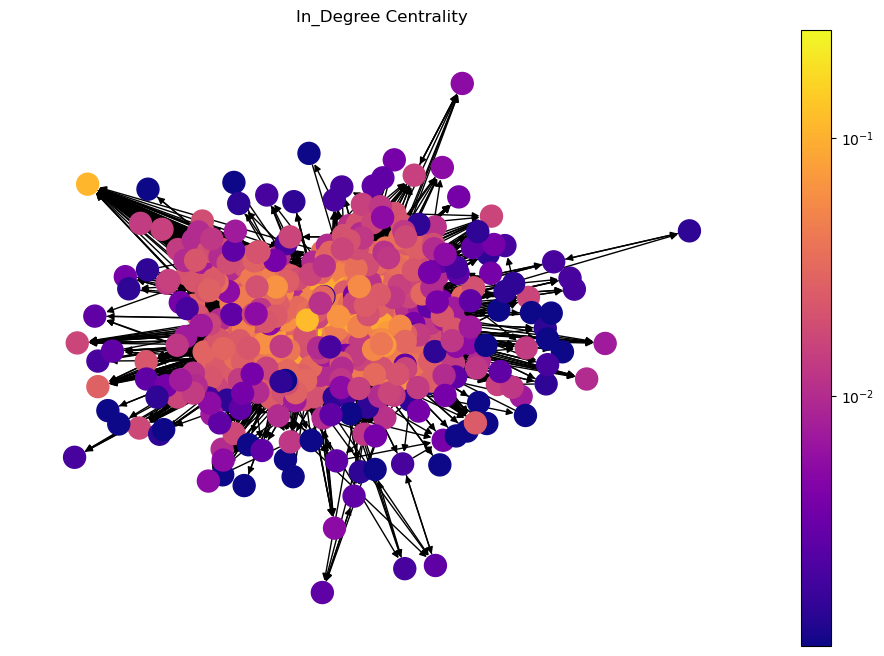

In [41]:
plt.figure(figsize=(12,8))
pos = nx.spring_layout(DG_strong)
draw(DG_strong, pos, in_degree_centr, 'In_Degree Centrality')

#NB: node 365 (high in_degree_centrality)

In [44]:
degree_centr_in_sorted=dict(sorted(in_degree_centr.items(), key=lambda item: item[1],reverse=True))
print(type(degree_centr_in_sorted))
print(degree_centr_in_sorted) 

<class 'dict'>
{160: 0.2630922693266833, 62: 0.22194513715710723, 107: 0.20947630922693267, 121: 0.19451371571072318, 86: 0.19077306733167082, 434: 0.18703241895261846, 183: 0.1770573566084788, 129: 0.16957605985037405, 64: 0.16832917705735662, 128: 0.16334164588528677, 106: 0.15710723192019949, 166: 0.15710723192019949, 5: 0.15336658354114713, 82: 0.14962593516209477, 283: 0.1483790523690773, 211: 0.14463840399002492, 256: 0.14463840399002492, 301: 0.1433915211970075, 105: 0.14214463840399003, 249: 0.13840399002493764, 21: 0.1371571072319202, 420: 0.13591022443890274, 87: 0.13466334164588528, 114: 0.13466334164588528, 282: 0.13216957605985036, 63: 0.128428927680798, 280: 0.128428927680798, 58: 0.12718204488778054, 115: 0.12468827930174563, 212: 0.12468827930174563, 142: 0.12219451371571072, 96: 0.11970074812967581, 28: 0.11845386533665835, 169: 0.11845386533665835, 820: 0.11845386533665835, 333: 0.11596009975062344, 6: 0.11471321695760599, 44: 0.11346633416458853, 81: 0.11346633416458

## out_degree_centrality

0.03748101725760353


<Figure size 1500x1000 with 0 Axes>

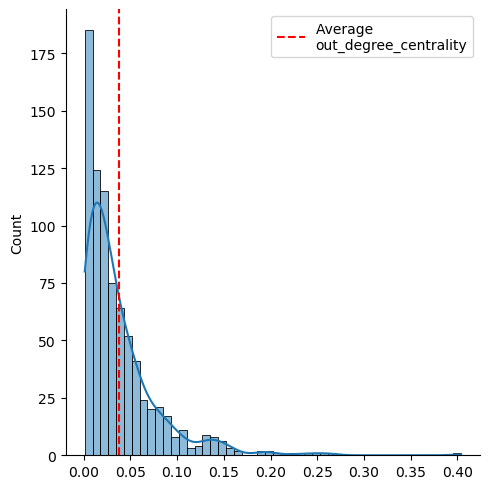

In [27]:
out_degree_centr = nx.out_degree_centrality(DG_strong) 

from matplotlib.lines import Line2D

print(average(list(out_degree_centr.values())))
plt.figure(figsize=(15,10))
sns.displot(list(out_degree_centr.values()), kde=True)
plt.axvline(average(list(out_degree_centr.values())), color='red', ls='--')

line = [Line2D([0], [0], color='red', linestyle='--')]

labels = ["Average \nout_degree_centrality"]
plt.legend(line, labels)
plt.show()

#Same value 

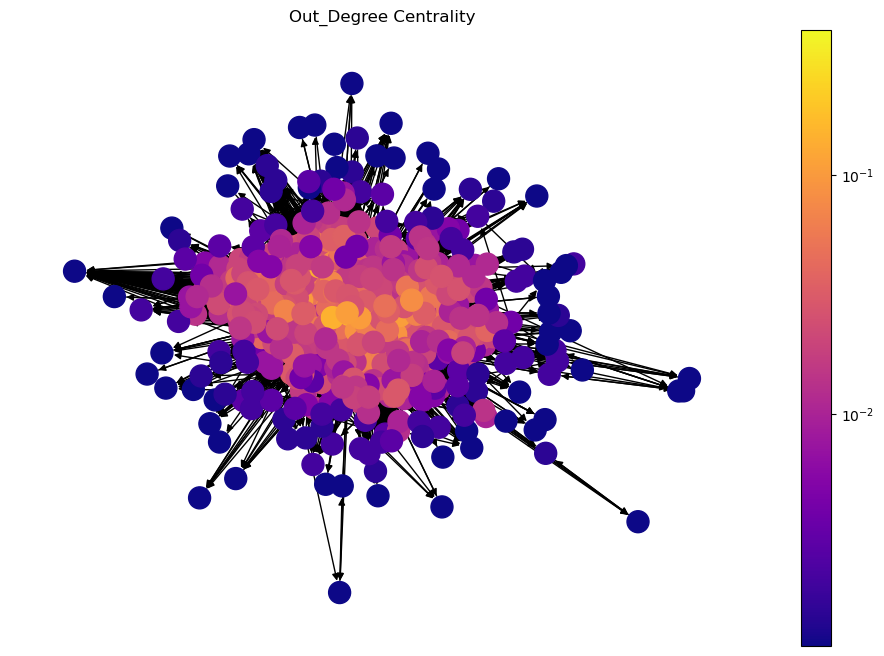

In [42]:
plt.figure(figsize=(12,8))
pos = nx.spring_layout(DG_strong)
draw(DG_strong, pos, out_degree_centr, 'Out_Degree Centrality')
#NB: node 365 (low out_degree_centrality)

In [45]:
degree_centr_out_sorted=dict(sorted(out_degree_centr.items(), key=lambda item: item[1],reverse=True))
print(type(degree_centr_out_sorted))
print(degree_centr_out_sorted) 

<class 'dict'>
{160: 0.40399002493765584, 82: 0.2630922693266833, 121: 0.26059850374064836, 86: 0.2456359102244389, 107: 0.24189526184538654, 62: 0.22693266832917705, 13: 0.20448877805486285, 249: 0.19576059850374064, 183: 0.19451371571072318, 434: 0.19201995012468828, 5: 0.18952618453865336, 129: 0.16458852867830423, 211: 0.16458852867830423, 21: 0.15586034912718205, 84: 0.1546134663341646, 114: 0.15336658354114713, 87: 0.15211970074812967, 333: 0.15211970074812967, 533: 0.15211970074812967, 166: 0.1508728179551122, 142: 0.14463840399002492, 820: 0.14463840399002492, 105: 0.1433915211970075, 282: 0.1433915211970075, 83: 0.14214463840399003, 283: 0.14214463840399003, 58: 0.14089775561097256, 64: 0.13840399002493764, 377: 0.13840399002493764, 424: 0.13840399002493764, 115: 0.13466334164588528, 252: 0.13466334164588528, 6: 0.13216957605985036, 212: 0.13216957605985036, 405: 0.13216957605985036, 63: 0.13092269326683292, 128: 0.13092269326683292, 169: 0.128428927680798, 420: 0.128428927680

## Betweenness Centrality

0.001931938173372447


<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

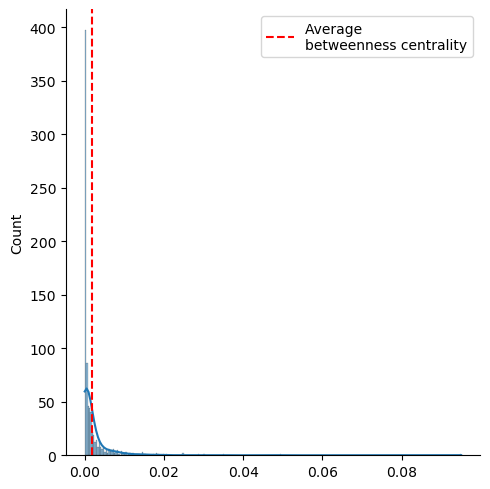

In [35]:
bet_centr = nx.betweenness_centrality(DG_strong)
plt.figure(figsize=(15,10))

from matplotlib.lines import Line2D

print(average(list(bet_centr.values())))
plt.figure(figsize=(15,10))
sns.displot(list(bet_centr.values()), kde=True)
plt.axvline(average(list(bet_centr.values())), color='red', ls='--')

line = [Line2D([0], [0], color='red', linestyle='--')]

labels = ['Average \nbetweenness centrality']
plt.legend(line, labels)
plt.show()

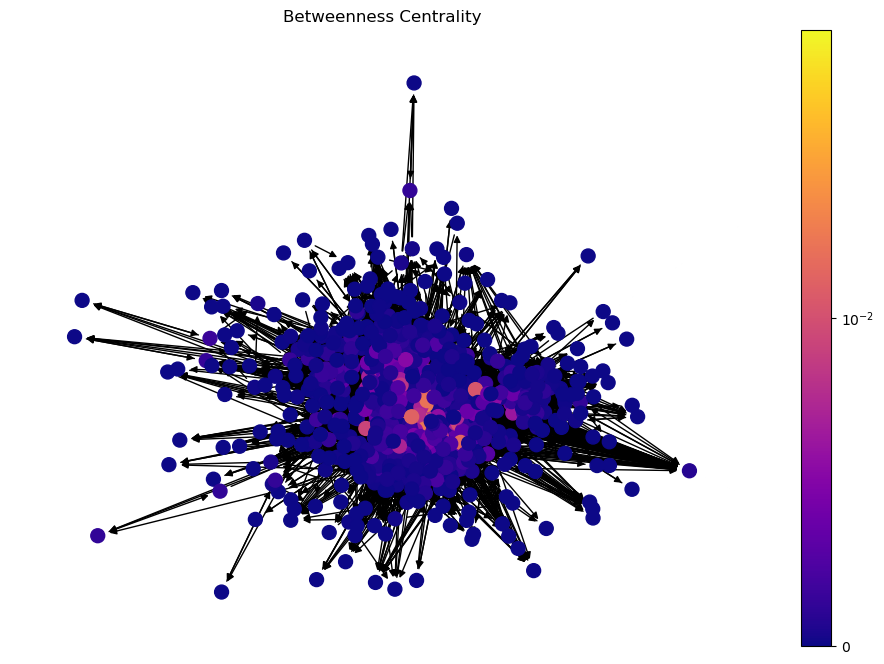

In [36]:
plt.figure(figsize=(12,8))
pos = nx.spring_layout(DG_strong)
draw(DG_strong, pos, bet_centr, 'Betweenness Centrality')

In [37]:
bet_centr_sorted=dict(sorted(bet_centr.items(), key=lambda item: item[1],reverse=True))
print(bet_centr_sorted)

{160: 0.09503664141077996, 86: 0.04944083820789595, 5: 0.03489695192833503, 62: 0.03003508850055017, 121: 0.028586369753047475, 107: 0.024988577690687304, 64: 0.024769706555074454, 82: 0.020582242989764854, 183: 0.01992144936901721, 129: 0.01844446129814485, 434: 0.01809888022384495, 166: 0.017988675082154463, 533: 0.017390199541171113, 6: 0.015413538952026571, 301: 0.014888392987486931, 377: 0.014744258590245573, 44: 0.014735151373110112, 21: 0.014598476862962576, 333: 0.014066080530258252, 13: 0.013515013942900448, 820: 0.013300208511169921, 128: 0.01219833072335541, 420: 0.012118505229280358, 249: 0.011714398959804195, 211: 0.011549522881805743, 96: 0.011273818178788052, 498: 0.011009479430205823, 114: 0.010526823033247349, 106: 0.010484734950539223, 87: 0.010214971841717426, 58: 0.009958025273948318, 232: 0.00989741839961899, 84: 0.009838096608540646, 405: 0.009799760396039874, 283: 0.009494071113957102, 141: 0.00938795756564723, 191: 0.009234161865552185, 290: 0.009224405227999619

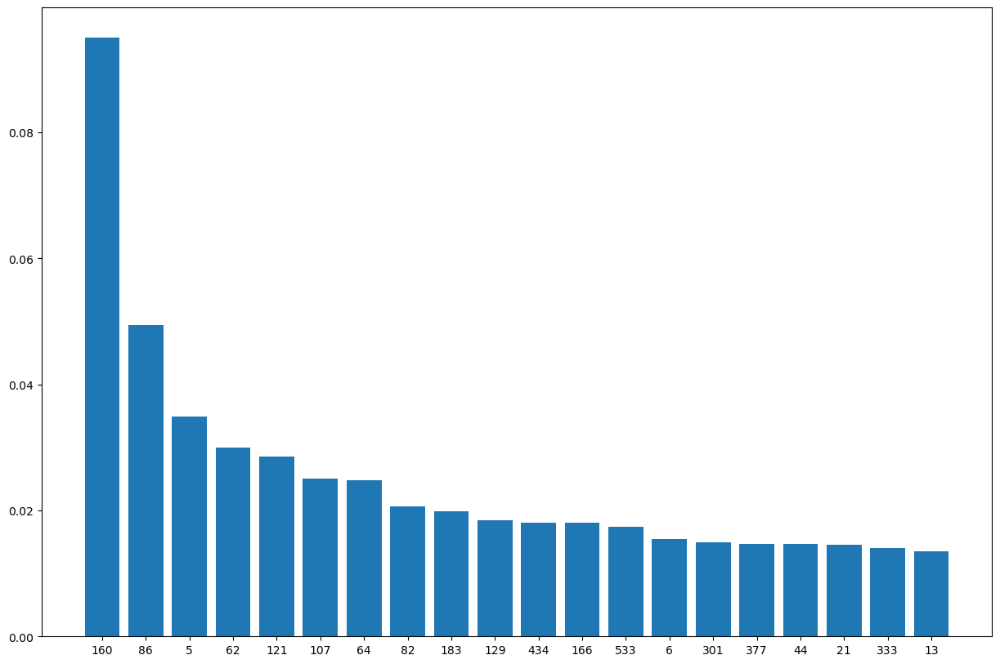

In [38]:
import itertools

sub_dict_bet_centr = dict(itertools.islice(bet_centr_sorted.items(), 20))

plt.figure(figsize=(15,10))
plt.bar(range(len(sub_dict_bet_centr)), list(sub_dict_bet_centr.values()), align='center') 
plt.xticks(range(len(sub_dict_bet_centr)), list(sub_dict_bet_centr.keys()))
plt.show()

## Closeness centrality

0.39880779087428825


<Figure size 1600x1000 with 0 Axes>

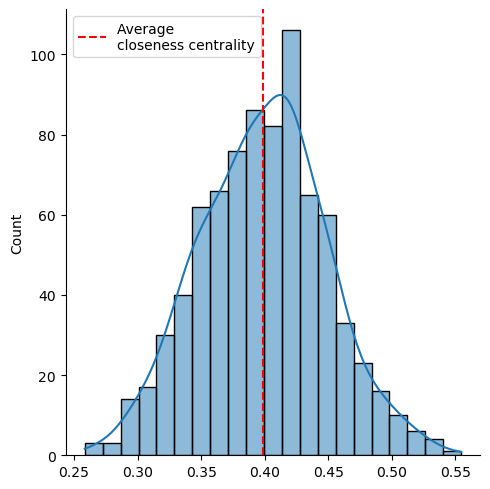

In [39]:
clos_centr = nx.closeness_centrality(DG_strong) 

from matplotlib.lines import Line2D

print(average(list(clos_centr.values())))
plt.figure(figsize=(16,10))
sns.displot(list(clos_centr.values()), kde=True)
plt.axvline(average(list(clos_centr.values())), color='red', ls='--')

line = [Line2D([0], [0], color='red', linestyle='--')]

labels = ['Average \ncloseness centrality']
plt.legend(line, labels, loc='upper left')
plt.show()

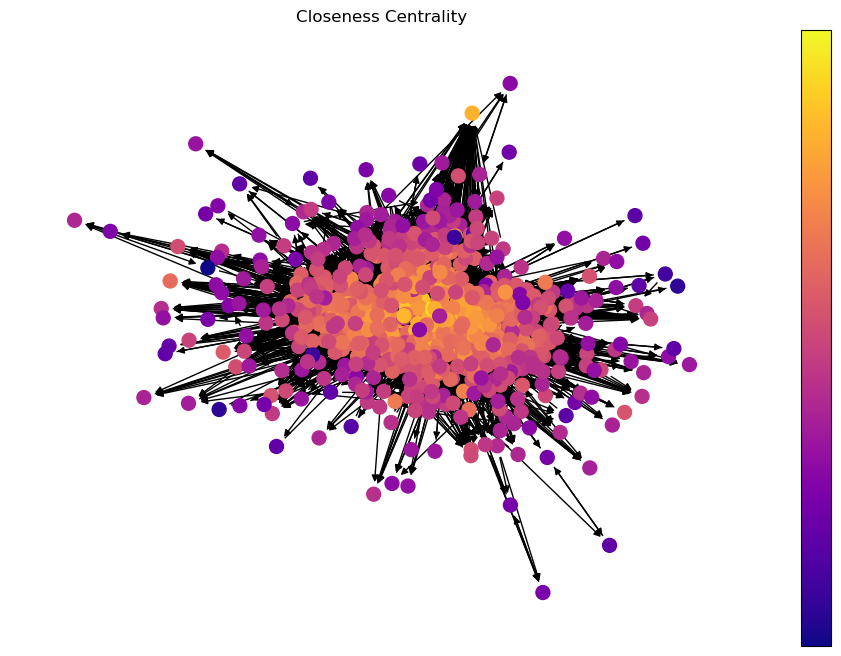

In [40]:
plt.figure(figsize=(12,8))
pos = nx.spring_layout(DG_strong)
draw(DG_strong, pos, clos_centr, 'Closeness Centrality')

In [41]:
clos_centr_sorted=dict(sorted(clos_centr.items(), key=lambda item: item[1],reverse=True))
print(clos_centr_sorted)

{160: 0.5546334716459198, 62: 0.536813922356091, 107: 0.532890365448505, 434: 0.5269382391590013, 121: 0.5265922521339461, 86: 0.5228161668839635, 64: 0.5194300518134715, 128: 0.5150931278098908, 129: 0.5150931278098908, 183: 0.5150931278098908, 166: 0.5134443021766966, 82: 0.5105028644175684, 249: 0.5088832487309645, 105: 0.50856055802156, 87: 0.5037688442211056, 283: 0.5034526051475204, 5: 0.5021916092673764, 106: 0.5021916092673764, 256: 0.4996884735202492, 212: 0.49937733499377335, 420: 0.4987562189054726, 301: 0.496594427244582, 142: 0.4962871287128713, 211: 0.49598021026592454, 21: 0.49445129469790383, 114: 0.4929317762753534, 282: 0.4923265807243708, 280: 0.4908200734394125, 820: 0.4908200734394125, 115: 0.48932275777913364, 81: 0.48902439024390243, 365: 0.48724179829890646, 424: 0.4866504854368932, 533: 0.4848851269649335, 83: 0.4845921450151057, 405: 0.4845921450151057, 28: 0.48429951690821255, 340: 0.4831325301204819, 366: 0.4831325301204819, 169: 0.4828416616496087, 58: 0.48

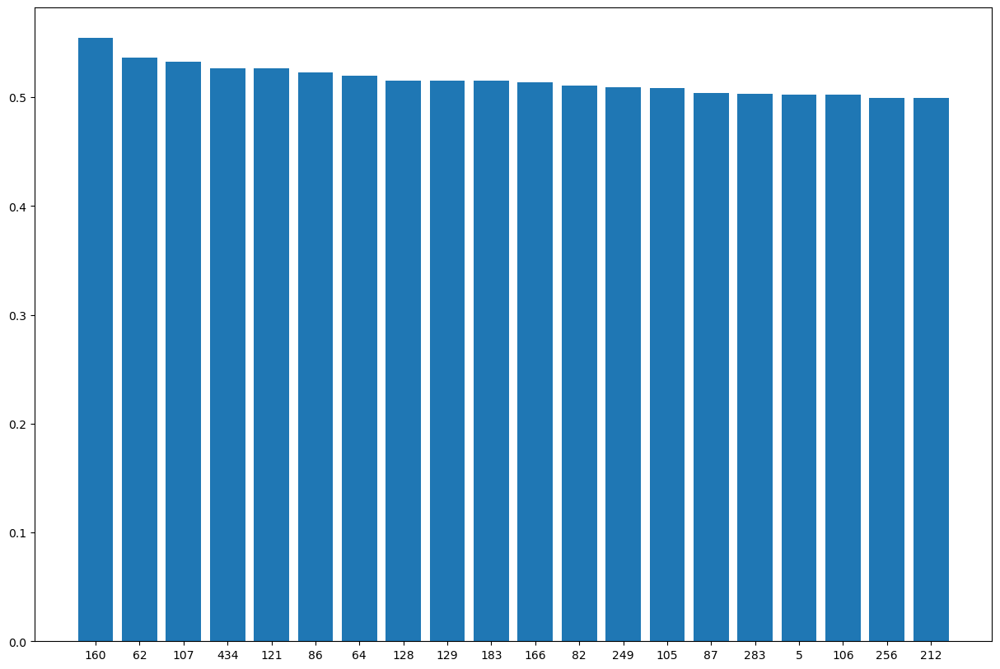

In [42]:
import itertools

sub_dict_clos_centr = dict(itertools.islice(clos_centr_sorted.items(), 20))

plt.figure(figsize=(15,10))
plt.bar(range(len(sub_dict_clos_centr)), list(sub_dict_clos_centr.values()), align='center') 
plt.xticks(range(len(sub_dict_clos_centr)), list(sub_dict_clos_centr.keys()))
plt.show()

## Eigenvector centrality

0.02401910607837406


<Figure size 1600x1000 with 0 Axes>

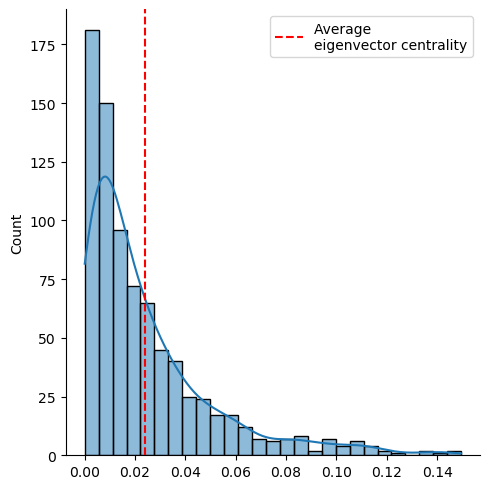

In [43]:
eig_centr = nx.eigenvector_centrality(DG_strong) 

from matplotlib.lines import Line2D

print(average(list(eig_centr.values())))
plt.figure(figsize=(16,10))
sns.displot(list(eig_centr.values()), kde=True)
plt.axvline(average(list(eig_centr.values())), color='red', ls='--')

line = [Line2D([0], [0], color='red', linestyle='--')]

labels = ['Average \neigenvector centrality']
plt.legend(line, labels, loc='upper right')
plt.show()

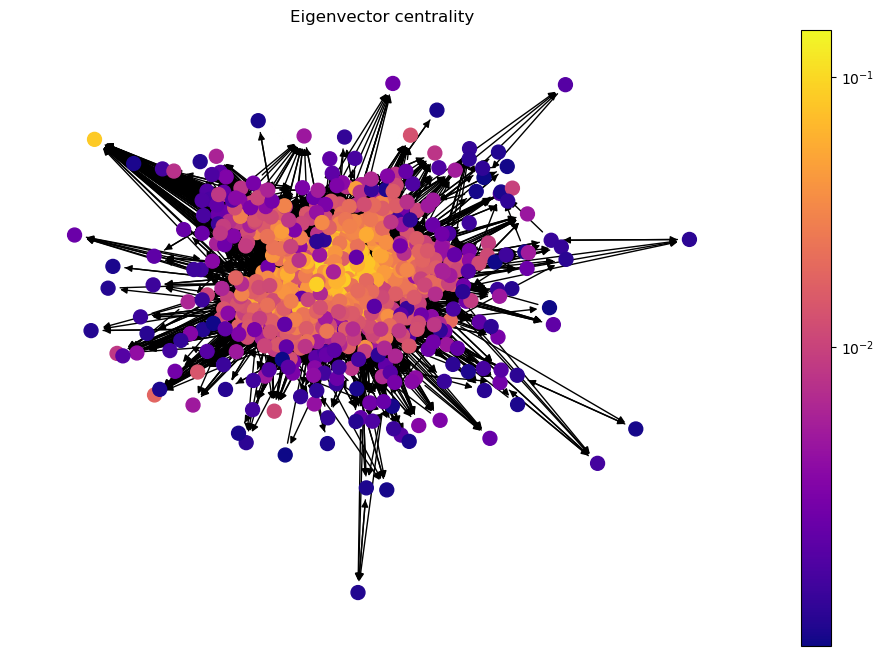

In [44]:
plt.figure(figsize=(12,8))
pos = nx.spring_layout(DG_strong)
draw(DG_strong, pos, eig_centr, 'Eigenvector centrality')

In [45]:
eig_centr_sorted=dict(sorted(eig_centr.items(), key=lambda item: item[1],reverse=True))
print(eig_centr_sorted)

{160: 0.14954501482029278, 107: 0.14403125813396495, 62: 0.14042650614881144, 434: 0.1364445544828695, 121: 0.13643547347379073, 183: 0.12630898537762622, 128: 0.12053345115111949, 256: 0.11717826074331315, 249: 0.11584030030850473, 129: 0.11570321161714521, 82: 0.11252582330464862, 283: 0.11205504276788902, 114: 0.10962628867699602, 87: 0.1094601476661703, 106: 0.1090424716847943, 166: 0.10810914644428128, 211: 0.10732942357901173, 105: 0.1066862975227424, 212: 0.10509132444483713, 169: 0.10137392348306917, 115: 0.10074991882565397, 86: 0.09981956792048831, 280: 0.09692141933883648, 28: 0.09657287053625269, 63: 0.09566590246181483, 81: 0.09542442319908194, 21: 0.09523778561189843, 282: 0.09479393836923382, 64: 0.0943941047973098, 820: 0.08985689748084282, 58: 0.08900484061043806, 420: 0.08793384207766992, 424: 0.08639410814035507, 303: 0.08611544070098098, 329: 0.08577680482327085, 340: 0.08550766525559583, 142: 0.08476289483474896, 365: 0.08412159790593991, 405: 0.08379444430784844, 

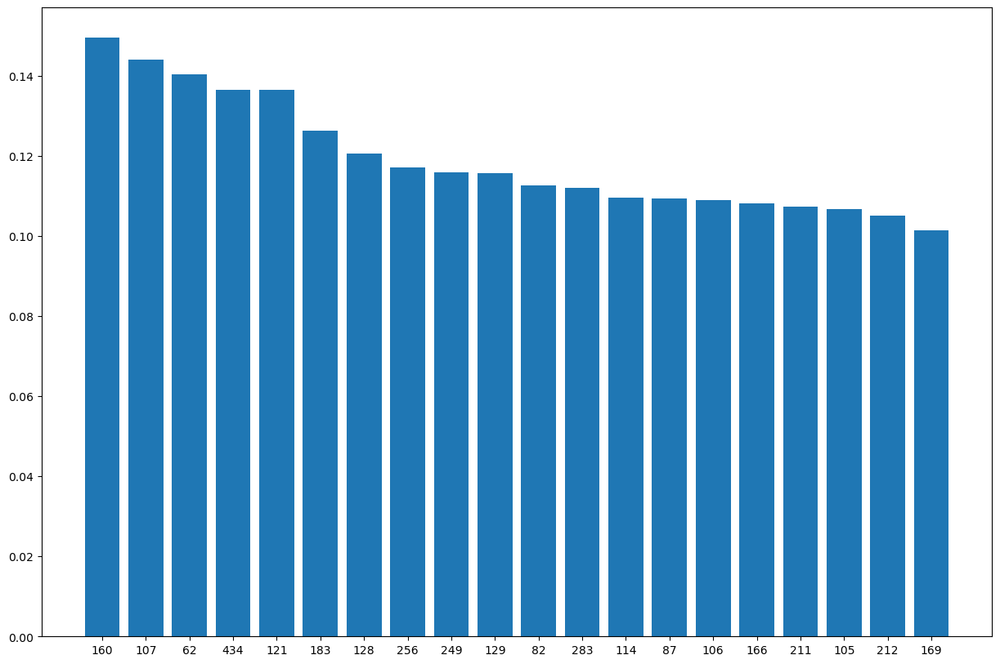

In [46]:
import itertools

sub_dict_eig_centr = dict(itertools.islice(eig_centr_sorted.items(), 20))

plt.figure(figsize=(15,10))
plt.bar(range(len(sub_dict_eig_centr)), list(sub_dict_eig_centr.values()), align='center') 
plt.xticks(range(len(sub_dict_eig_centr)), list(sub_dict_eig_centr.keys()))
plt.show()

# Ego network -> node 160

In [35]:
nodes_degrees = DG_strong.degree()
top_deg_node = max(nodes_degrees, key=lambda item: item[1])
print(top_deg_node)
print('Node with the greatest number of connections: '+ str(top_deg_node[0])+' ('+str(top_deg_node[1])+')')

(160, 535)
Node with the greatest number of connections: 160 (535)


In [33]:
print(DG_strong.in_degree(160))
print(DG_strong.out_degree(160))

211
324


In [23]:
node_degree_dict=nx.degree(DG_strong)
print(node_degree_dict)
subnet=nx.subgraph(DG_strong,[x for x in DG_strong.nodes() if node_degree_dict[x]>60]) #subnet with all nodes with a degree lower than 60

[(0, 70), (2, 156), (3, 114), (4, 155), (5, 275), (6, 198), (7, 114), (8, 60), (9, 58), (10, 75), (11, 131), (12, 93), (13, 224), (14, 123), (15, 80), (16, 114), (17, 161), (18, 86), (19, 118), (20, 116), (21, 235), (22, 25), (23, 128), (24, 58), (25, 50), (26, 51), (27, 92), (28, 171), (29, 91), (30, 109), (31, 80), (32, 53), (33, 41), (34, 47), (35, 95), (36, 61), (37, 52), (38, 66), (39, 47), (40, 98), (41, 136), (42, 115), (43, 16), (44, 170), (45, 74), (46, 115), (47, 82), (48, 95), (49, 21), (50, 25), (51, 108), (52, 37), (53, 58), (54, 86), (55, 67), (56, 76), (57, 107), (58, 215), (59, 87), (60, 88), (61, 116), (62, 360), (63, 208), (64, 246), (65, 114), (66, 43), (67, 15), (68, 77), (69, 99), (70, 28), (71, 27), (72, 11), (73, 52), (74, 152), (75, 30), (76, 35), (77, 34), (79, 67), (80, 116), (81, 178), (82, 331), (83, 199), (84, 171), (85, 60), (86, 350), (87, 230), (88, 47), (89, 108), (90, 44), (91, 54), (92, 75), (93, 122), (94, 69), (95, 74), (96, 197), (97, 43), (98, 38)

In [24]:
#degree_values = dict(node_degree_dict).values()
#print(degree_values)

In [25]:
# loop to sum all values
res = 0
for val in dict(node_degree_dict).values():
    res += val
res = res / len(node_degree_dict)
 
# printing result
print("Mean of dictionary's values : " + str(res))

Mean of dictionary's values : 60.11955168119552


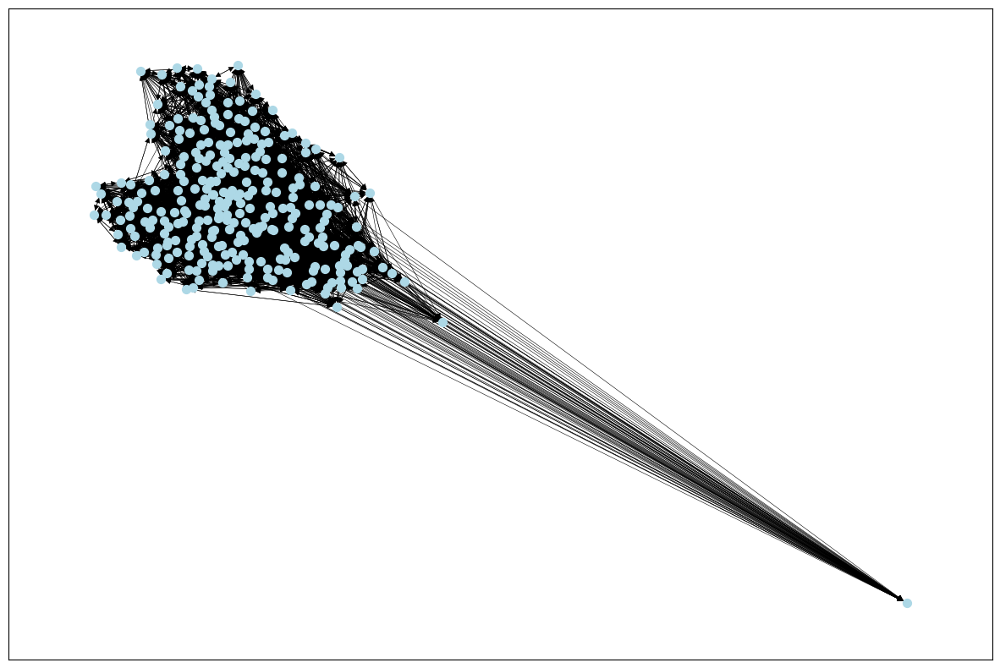

In [26]:
plt.figure(figsize=(15,10))

pos = nx.spring_layout(subnet)
nx.draw_networkx(subnet, pos, node_color = 'lightblue',  with_labels=False, node_size= 50, width= 0.4)
#edge_labels = nx.get_edge_attributes(G_Dep_Reduced, "weight")
#nx.draw_networkx_edge_labels(G_Dep_Reduced, pos, edge_labels=edge_labels)
plt.show()

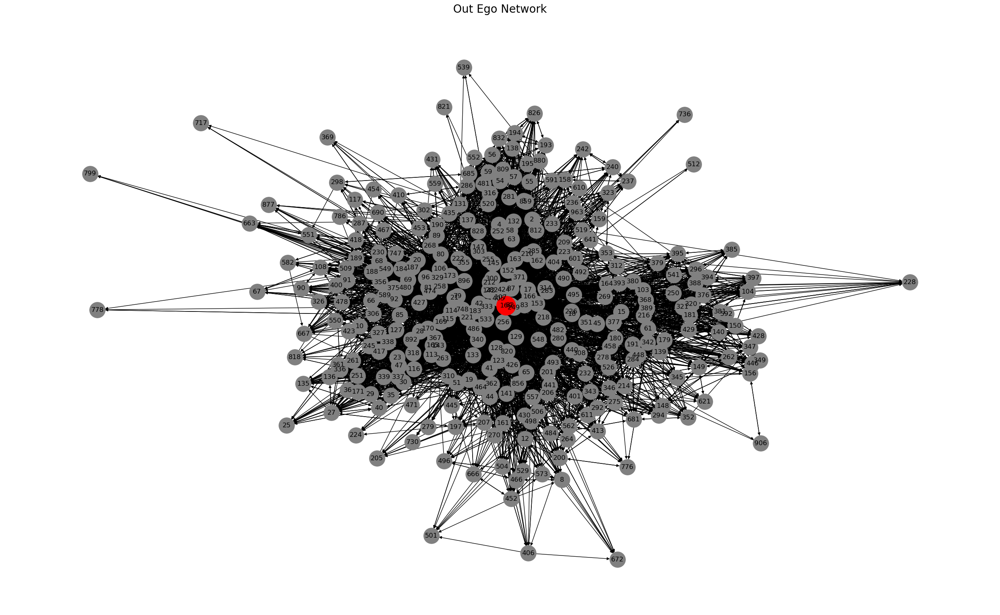

In [71]:
#nx.ego_graph(DG_strong, 160, radius=1, center=True, undirected=False, distance=None)

# Defining ego as large and red
# while alters are grey
# Let '160' be the ego
ego = 160
options = {"node_size": 1200, "node_color": "r"}


# create ego network
ego_net1 = nx.ego_graph(DG_strong, ego)
  
# showing the ego network
plt.figure(figsize=(25,15))
pos = nx.spring_layout(ego_net1)
nx.draw(ego_net1, pos, node_color="grey", 
        node_size = 800, with_labels = True)
  
nx.draw_networkx_nodes(ego_net1, pos, nodelist = [ego], **options)
plt.title("Out Ego Network", fontsize = 20)
  
plt.show()

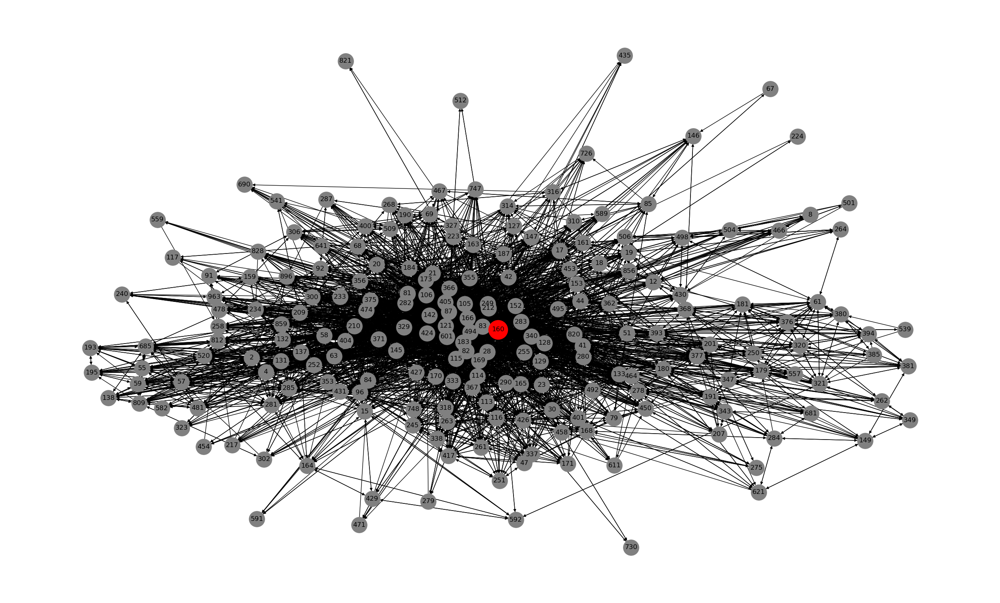

In [73]:
R_DG_strong = DG_strong.reverse()

#nx.ego_graph(DG_strong, 160, radius=1, center=True, undirected=False, distance=None)

# Defining ego as large and red
# while alters are grey
# Let '160' be the ego
ego = 160
options = {"node_size": 1200, "node_color": "r"}


# create ego network
ego_net2 = nx.ego_graph(R_DG_strong, ego)
  
# showing the ego network
plt.figure(figsize=(25,15))
pos = nx.spring_layout(ego_net)
nx.draw(ego_net2, pos, node_color="grey", 
        node_size = 800, with_labels = True)
  
nx.draw_networkx_nodes(ego_net2, pos, nodelist = [ego], **options)
  
plt.show()

In [53]:
#print(len(ego_net2.nodes))
#print(len(ego_net2.edges))

337
0.4766315643111034


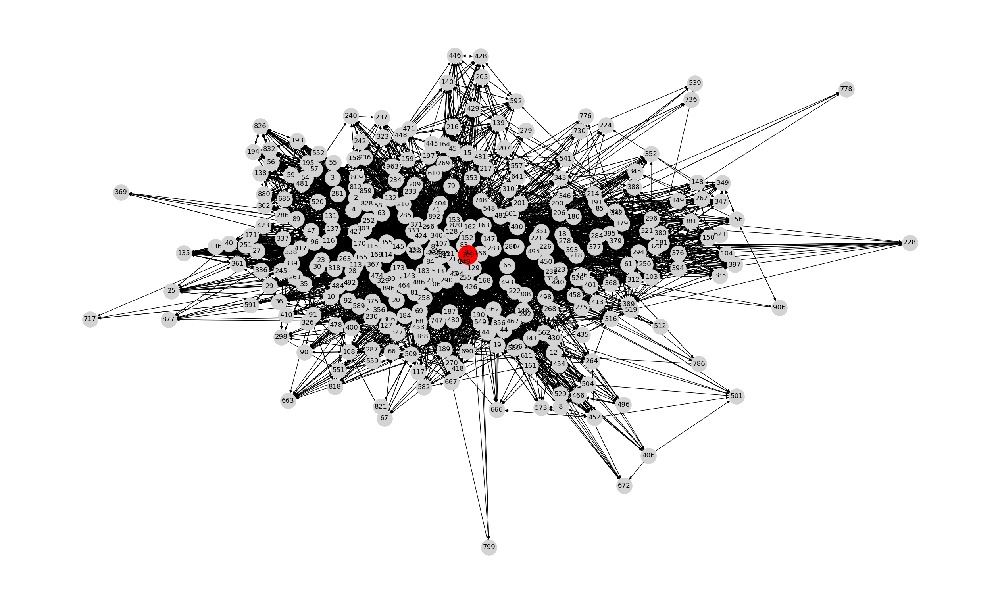

In [53]:
#nx.ego_graph(DG_strong, 160, radius=1, center=True, undirected=False, distance=None)

# Defining ego as large and red
# while alters are grey
# Let '160' be the ego
ego = 160
options = {"node_size": 1200, "node_color": "r"}


# create ego network
ego_net = nx.ego_graph(DG_strong, ego, radius=1, undirected=True) #undirected = True to get both directions
print(len(ego_net.nodes))

# showing the ego network
plt.figure(figsize=(25,15))
pos = nx.spring_layout(ego_net)
nx.draw(ego_net, pos, node_color="lightgrey", 
        node_size = 800, with_labels = True)
  
nx.draw_networkx_nodes(ego_net, pos, nodelist = [ego], **options)
print(nx.average_clustering(ego_net))
  
plt.show()

337


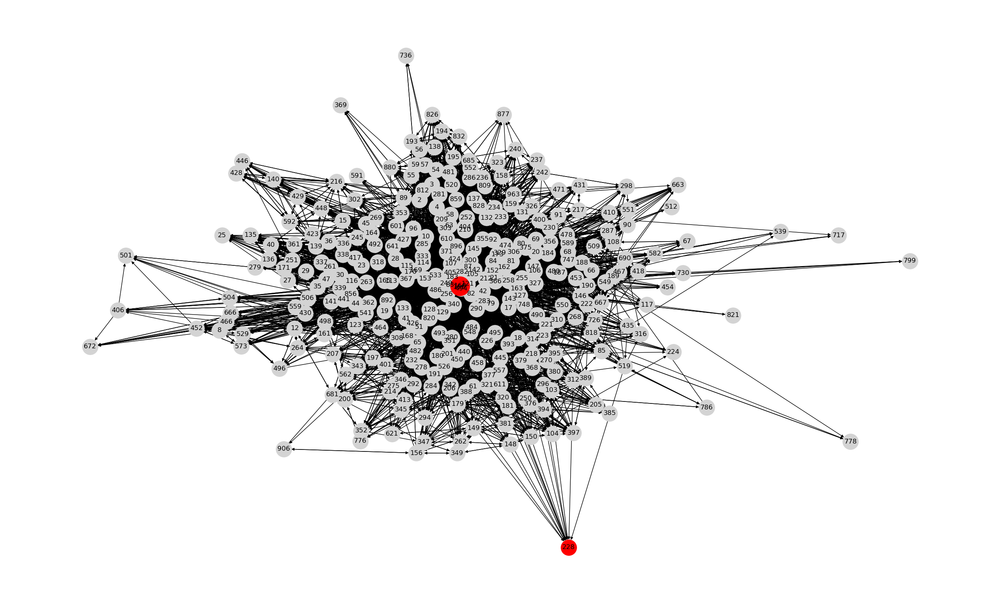

In [43]:
#nx.ego_graph(DG_strong, 160, radius=1, center=True, undirected=False, distance=None)

# Defining ego as large and red
# while alters are grey
# Let '160' be the ego
ego = 160
options = {"node_size": 1200, "node_color": "r"}


# create ego network
ego_net = nx.ego_graph(DG_strong, ego, radius=1, undirected=True) #undirected = True to get both directions
print(len(ego_net.nodes))

# showing the ego network
plt.figure(figsize=(25,15))
pos = nx.spring_layout(ego_net)
nx.draw(ego_net, pos, node_color="lightgrey", node_size = 800, with_labels = True)
nx.draw_networkx_nodes(ego_net, pos, node_size= 800, nodelist=[228], node_color='r')

  
nx.draw_networkx_nodes(ego_net, pos, nodelist = [ego], **options)
  
plt.show()

In [40]:
print(len(ego_net.nodes))
print(len(ego_net.edges))
print(nx.average_clustering(ego_net))
print(nx.density(ego_net))

337
9527
0.4766315643111034
0.08413699307616222


In [80]:
print(len(ego_net.nodes))
print(len(ego_net.edges))
print(len(ego_net.in_degree()))
print(len(ego_net.out_degree()))
print(len(ego_net.degree()))

337
9527
337
337
337


## Node 365

In [29]:
print(DG_strong.in_degree(365))
print(DG_strong.out_degree(365))

88
1


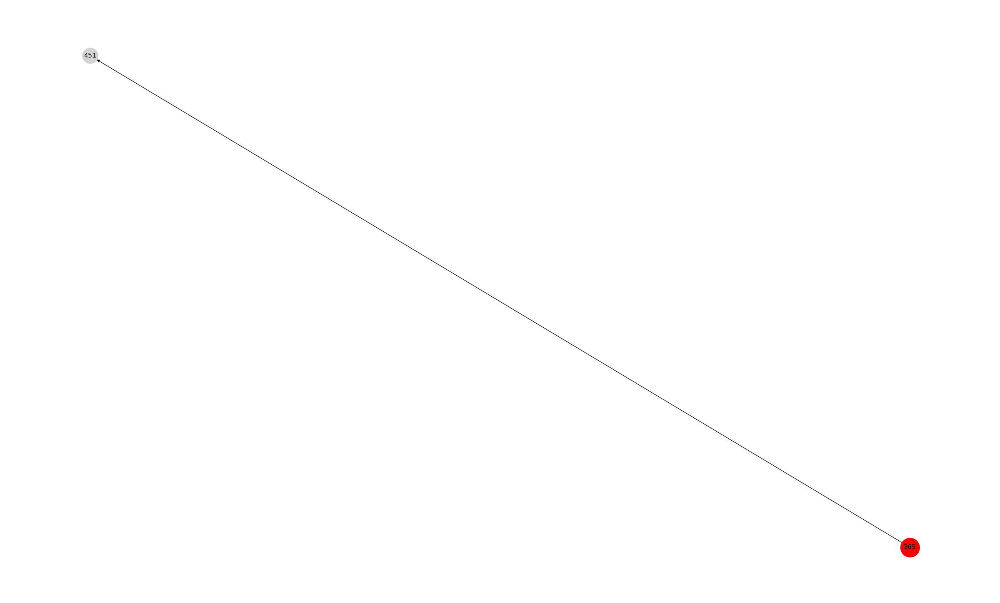

In [49]:
#nx.ego_graph(DG_strong, 160, radius=1, center=True, undirected=False, distance=None)

# Defining ego as large and red
# while alters are grey
# Let '160' be the ego
ego = 365
options = {"node_size": 1200, "node_color": "r"}


# create ego network
ego_net = nx.ego_graph(DG_strong, ego, radius=1) #without undirected only out edges
 
# showing the ego network
plt.figure(figsize=(25,15))
pos = nx.spring_layout(ego_net)
nx.draw(ego_net, pos, node_color="lightgrey", 
        node_size = 800, with_labels = True)
  
nx.draw_networkx_nodes(ego_net, pos, nodelist = [ego], **options)
  
plt.show()

0.569065075293622


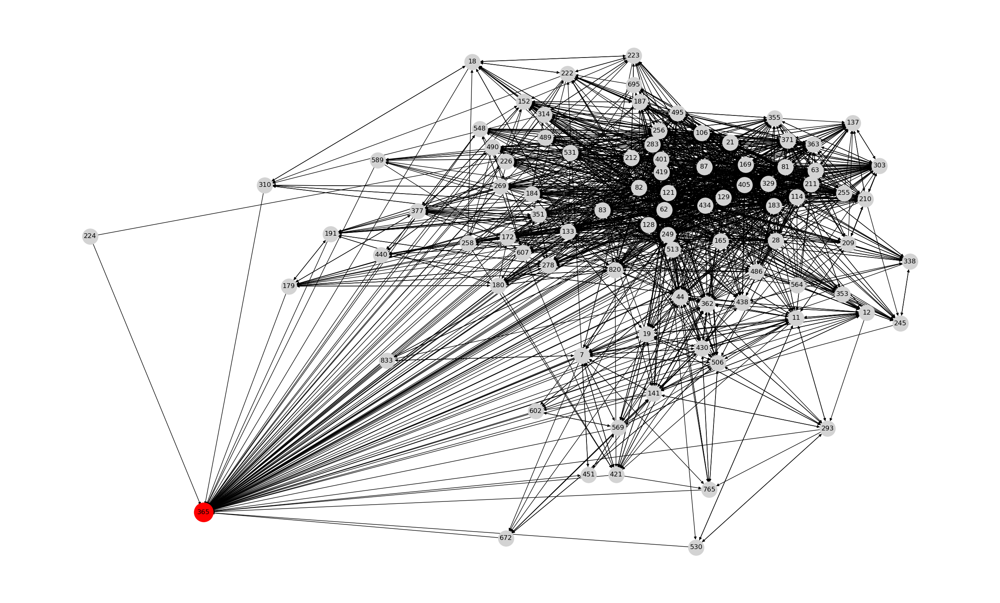

In [52]:
#nx.ego_graph(DG_strong, 160, radius=1, center=True, undirected=False, distance=None)

# Defining ego as large and red
# while alters are grey
# Let '160' be the ego
ego = 365
options = {"node_size": 1200, "node_color": "r"}

# create ego network
ego_net = nx.ego_graph(DG_strong, ego, radius=1, undirected=True) #undirected = True to get both directions
print(nx.average_clustering(ego_net))

# showing the ego network
plt.figure(figsize=(25,15))
pos = nx.spring_layout(ego_net)
nx.draw(ego_net, pos, node_color="lightgrey", 
        node_size = 800, with_labels = True)
  
nx.draw_networkx_nodes(ego_net, pos, nodelist = [ego], **options)
  
plt.show()

In [95]:
print(len(ego_net.nodes))
print(len(ego_net.edges))
print(len(ego_net.in_degree()))
print(len(ego_net.out_degree()))
print(len(ego_net.degree()))

213
4891
213
213
213


In [24]:
clust = nx.clustering(DG_strong)
print(clust)

{0: 0.2546102263202012, 2: 0.2999001996007984, 3: 0.39435408195182986, 4: 0.3233906302662622, 5: 0.10418995900548368, 6: 0.1496188710341986, 7: 0.2698139753009223, 8: 0.4220630372492837, 9: 0.36650336803429273, 10: 0.2693847834000728, 11: 0.195577628000473, 12: 0.29009433962264153, 13: 0.11025959956666533, 14: 0.2101274312541918, 15: 0.3311501597444089, 16: 0.2728125, 17: 0.252768247036806, 18: 0.26428374275462324, 19: 0.24930707512764405, 20: 0.2505282221551464, 21: 0.21087504106888622, 22: 0.3888888888888889, 23: 0.3252445214807478, 24: 0.40736196319018403, 25: 0.3758278145695364, 26: 0.47533810660302306, 27: 0.35408138694919333, 28: 0.3068574588690723, 29: 0.34158659768415867, 30: 0.3735022252653201, 31: 0.38235294117647056, 32: 0.5117820324005891, 33: 0.5830235439900867, 34: 0.5790216368767639, 35: 0.36548452676756266, 36: 0.4318432671081678, 37: 0.42857142857142855, 38: 0.3989161168708765, 39: 0.4288389513108614, 40: 0.30178268251273344, 41: 0.27543533019384514, 42: 0.301243666513

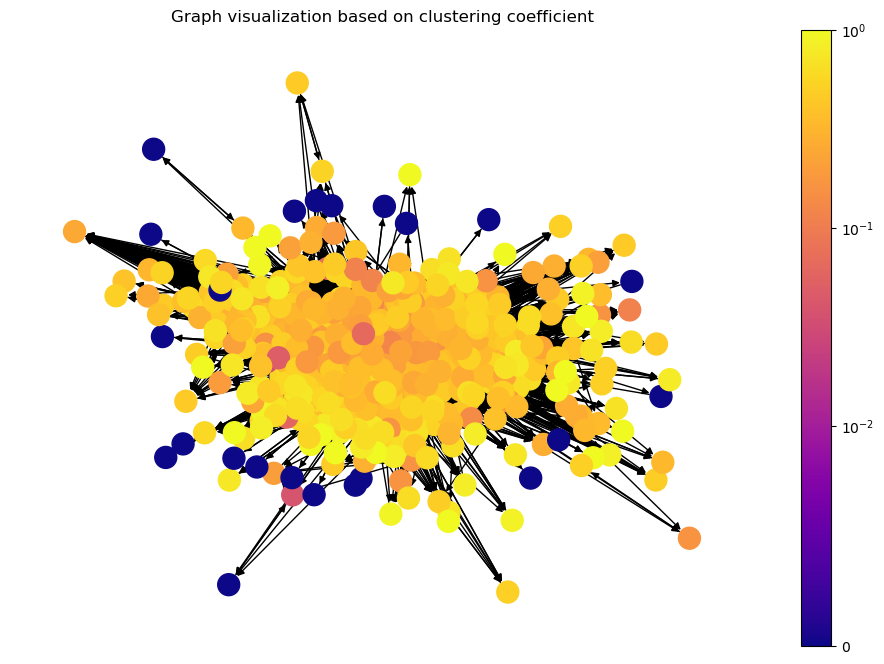

In [25]:
plt.figure(figsize=(12,8))
pos = nx.spring_layout(DG_strong)
draw(DG_strong, pos, clust ,'Graph visualization based on clustering coefficient')

## Triads

In [43]:
nx.triadic_census(DG_strong)

{'003': 74752034,
 '012': 4352524,
 '102': 5962520,
 '021D': 65394,
 '021U': 34911,
 '021C': 51590,
 '111D': 144816,
 '111U': 227895,
 '030T': 5024,
 '030C': 419,
 '201': 279934,
 '120D': 6983,
 '120U': 9461,
 '120C': 7455,
 '210': 39656,
 '300': 34185}

In [44]:
triadic_census_DG_strong = nx.triadic_census(c)
for key, value in triadic_census_DG_strong.items():
    print(f"{key}: {value}")

003: 74752034
012: 4352524
102: 5962520
021D: 65394
021U: 34911
021C: 51590
111D: 144816
111U: 227895
030T: 5024
030C: 419
201: 279934
120D: 6983
120U: 9461
120C: 7455
210: 39656
300: 34185


In [45]:
lista_ = ["003", "012", "102", "021D", "021U", "021C", "111D", "111U", "030T", "030C", "201", "120D", "120U", "120C", "210","300"]


In [48]:
triadic_census300 = dict(("300", triadic_census_DG_strong["300"]) for key in lista_)
print(triadic_census300)

{'300': 34185}


In [ ]:
# nx.triads_by_type(DG_strong)

## Community Detection

In [ ]:
from networkx.algorithms import community

communities_generator = community.louvain_communities(DG_strong, resolution=1, threshold=1e-07, seed=None)
print(type(communities_generator))


In [ ]:
from networkx.algorithms.community import greedy_modularity_communities
c = greedy_modularity_communities(DG_strong, weight=None, resolution=1, cutoff=1, best_n=None)

In [26]:
sorted(c[0])

[2,
 3,
 4,
 5,
 10,
 13,
 15,
 16,
 20,
 21,
 22,
 45,
 46,
 49,
 50,
 54,
 55,
 56,
 57,
 58,
 59,
 62,
 63,
 66,
 68,
 69,
 70,
 71,
 72,
 77,
 80,
 81,
 82,
 83,
 84,
 87,
 88,
 89,
 90,
 91,
 92,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 115,
 117,
 118,
 121,
 124,
 125,
 126,
 127,
 131,
 132,
 137,
 138,
 139,
 140,
 142,
 144,
 145,
 147,
 152,
 153,
 154,
 155,
 158,
 159,
 162,
 163,
 164,
 173,
 174,
 175,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 192,
 193,
 194,
 195,
 208,
 209,
 210,
 211,
 212,
 216,
 217,
 230,
 233,
 234,
 235,
 236,
 237,
 238,
 240,
 241,
 242,
 243,
 244,
 249,
 252,
 253,
 254,
 255,
 256,
 258,
 259,
 260,
 269,
 271,
 272,
 273,
 274,
 279,
 281,
 282,
 285,
 286,
 287,
 288,
 298,
 299,
 300,
 301,
 302,
 303,
 304,
 305,
 306,
 322,
 323,
 325,
 326,
 327,
 328,
 329,
 333,
 334,
 335,
 353,
 354,
 355,
 356,
 357,
 363,
 364,
 366,
 369,
 371,
 372,
 373,
 375,
 400,
 404,
 405,
 408,
 410,

In [27]:
sorted(c)

[frozenset({2,
            3,
            4,
            5,
            10,
            13,
            15,
            16,
            20,
            21,
            22,
            45,
            46,
            49,
            50,
            54,
            55,
            56,
            57,
            58,
            59,
            62,
            63,
            66,
            68,
            69,
            70,
            71,
            72,
            77,
            80,
            81,
            82,
            83,
            84,
            87,
            88,
            89,
            90,
            91,
            92,
            96,
            97,
            98,
            99,
            100,
            101,
            102,
            105,
            106,
            107,
            108,
            109,
            110,
            111,
            112,
            115,
            117,
            118,
            121,
            124,
            

In [28]:
print(len(c))

5


In [29]:
#print(c[1])

frozenset({0, 6, 14, 17, 18, 41, 42, 51, 52, 53, 60, 61, 64, 65, 67, 73, 74, 79, 85, 86, 93, 94, 95, 103, 104, 120, 122, 123, 128, 129, 133, 134, 143, 146, 148, 149, 150, 156, 157, 160, 166, 167, 168, 172, 176, 177, 178, 179, 180, 181, 182, 191, 196, 197, 198, 199, 200, 201, 202, 204, 205, 206, 207, 214, 215, 218, 219, 220, 221, 222, 223, 224, 225, 226, 228, 231, 232, 248, 250, 257, 262, 268, 270, 275, 276, 277, 278, 280, 283, 284, 290, 291, 292, 294, 295, 296, 297, 307, 308, 309, 310, 311, 312, 313, 314, 316, 317, 320, 321, 330, 331, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 368, 376, 377, 378, 379, 380, 381, 385, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 399, 401, 403, 413, 415, 419, 425, 426, 435, 440, 445, 450, 457, 458, 459, 464, 465, 482, 483, 484, 486, 491, 493, 494, 495, 497, 511, 515, 519, 521, 522, 523, 526, 528, 534, 535, 537, 539, 542, 543, 544, 553, 554, 556, 557, 559, 560, 562, 563, 567, 568, 572, 581, 585, 593, 598, 600, 601, 611, 614,

In [30]:
#print(c)
#print(type(c))

NameError: name 'c' is not defined

In [ ]:
#Se sono state trovate 5 comunità si deduce che sebbene ci sia una divisione in dipartimenti le persone sono connesse e non si 
#isolano all'interno di 42 comunità distinte, pari al numero di dipartimenti.
#C'è molta comunicazione all'interno dell'istituto

In [31]:
node_lists_community1 = list(c[0])
node_lists_community2 = list(c[1])
node_lists_community3 = list(c[2])
node_lists_community4 = list(c[3])
node_lists_community5 = list(c[4])

In [34]:
print(node_lists_community1)
print(node_lists_community5)

[2, 3, 4, 5, 10, 13, 15, 16, 20, 21, 22, 45, 46, 49, 50, 54, 55, 56, 57, 58, 59, 62, 63, 66, 68, 69, 70, 71, 72, 77, 80, 81, 82, 83, 84, 87, 88, 89, 90, 91, 92, 96, 97, 98, 99, 100, 101, 102, 105, 106, 107, 108, 109, 110, 111, 112, 115, 117, 118, 121, 124, 125, 126, 127, 131, 132, 137, 138, 139, 140, 142, 144, 145, 147, 152, 153, 154, 155, 158, 159, 162, 163, 164, 173, 174, 175, 183, 184, 185, 186, 187, 188, 189, 190, 192, 193, 194, 195, 208, 209, 210, 211, 212, 216, 217, 230, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 249, 252, 253, 254, 255, 256, 258, 259, 260, 269, 271, 272, 273, 274, 279, 281, 282, 285, 286, 287, 288, 298, 299, 300, 301, 302, 303, 304, 305, 306, 322, 323, 325, 326, 327, 328, 329, 333, 334, 335, 353, 354, 355, 356, 357, 363, 364, 366, 369, 371, 372, 373, 375, 400, 404, 405, 408, 410, 411, 412, 416, 418, 420, 422, 424, 427, 428, 429, 431, 432, 433, 434, 446, 447, 448, 453, 454, 456, 460, 461, 462, 463, 467, 469, 471, 473, 474, 476, 477, 478, 480, 481, 489

In [33]:
print(len(node_lists_community1))
print(len(node_lists_community2))
print(len(node_lists_community3))
print(len(node_lists_community4))
print(len(node_lists_community5))

344
280
89
85
5


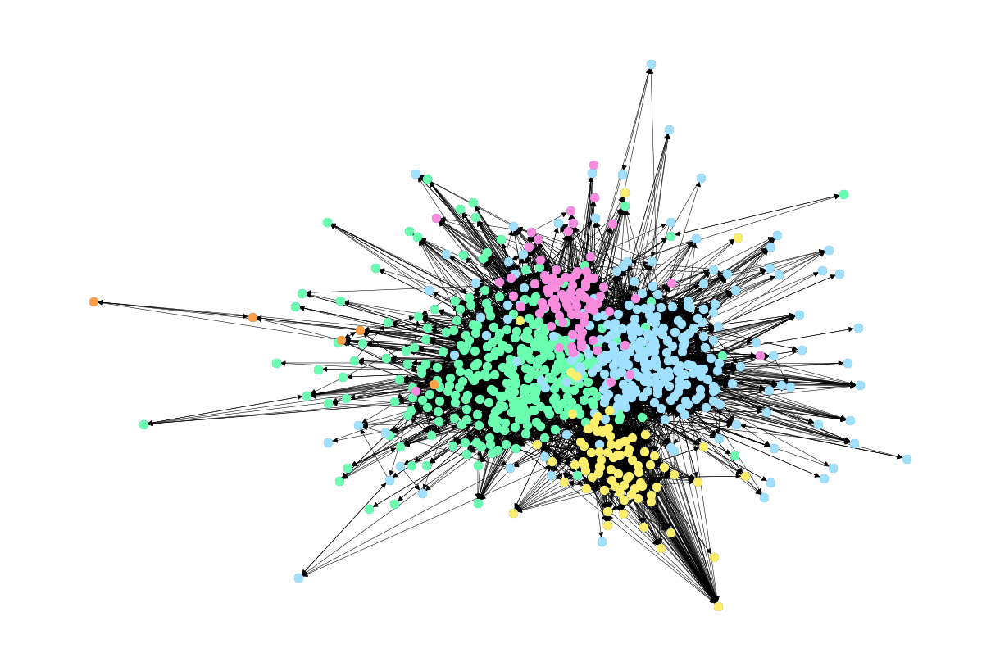

In [64]:
pos = nx.spring_layout(DG_strong) #calculate position for each node


plt.figure(figsize=(12,8))

# Draw the graph, but don't color the nodes
nx.draw(DG_strong, pos, edge_color='k',  with_labels=False, node_size= 50, width= 0.4)

#For each community list, draw the nodes, giving it a specific color.
nx.draw_networkx_nodes(DG_strong, pos, node_size= 50, nodelist=node_lists_community1, node_color='#6bffb0') #green
nx.draw_networkx_nodes(DG_strong, pos, node_size= 50, nodelist=node_lists_community2, node_color='#a1e1ff') #blue
nx.draw_networkx_nodes(DG_strong, pos, node_size= 50, nodelist=node_lists_community3, node_color='#fa8cde') #pink
nx.draw_networkx_nodes(DG_strong, pos, node_size= 50, nodelist=node_lists_community4, node_color='#ffee6b') #yellow
nx.draw_networkx_nodes(DG_strong, pos, node_size= 50, nodelist=node_lists_community5, node_color='#ffa047') #orange


plt.show()

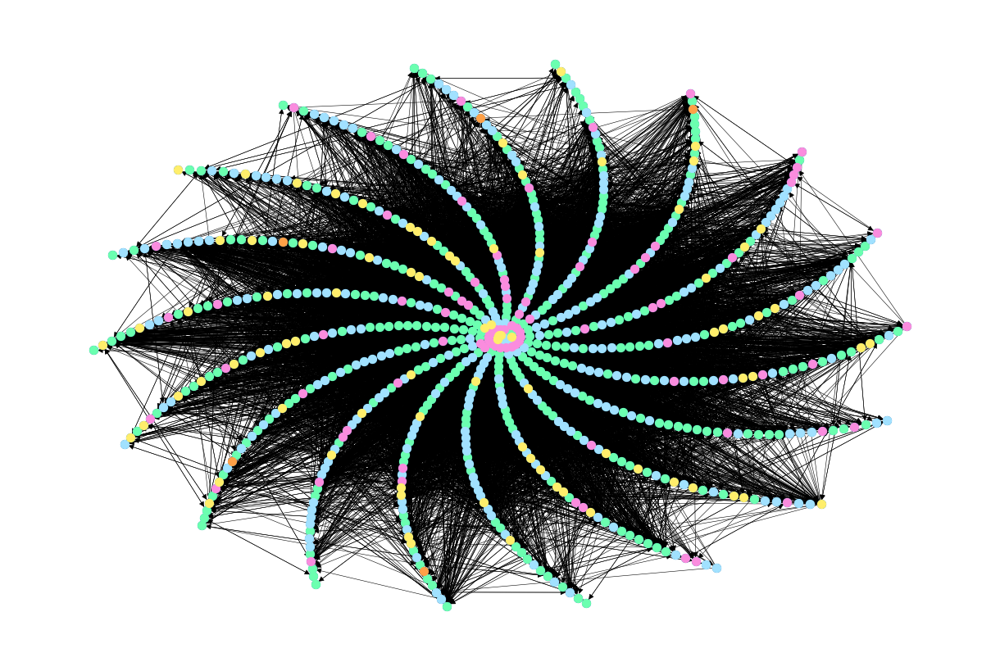

In [67]:
pos4 = nx.spiral_layout(DG_strong) #calculate position for each node


plt.figure(figsize=(12,8))

# Draw the graph, but don't color the nodes
nx.draw(DG_strong, pos4, edge_color='k',  with_labels=False, node_size= 50, width= 0.4)

#For each community list, draw the nodes, giving it a specific color.
nx.draw_networkx_nodes(DG_strong, pos4, node_size= 50, nodelist=node_lists_community1, node_color='#6bffb0') #green
nx.draw_networkx_nodes(DG_strong, pos4, node_size= 50, nodelist=node_lists_community2, node_color='#a1e1ff') #blue
nx.draw_networkx_nodes(DG_strong, pos4, node_size= 50, nodelist=node_lists_community3, node_color='#fa8cde') #pink
nx.draw_networkx_nodes(DG_strong, pos4, node_size= 50, nodelist=node_lists_community4, node_color='#ffee6b') #yellow
nx.draw_networkx_nodes(DG_strong, pos4, node_size= 50, nodelist=node_lists_community5, node_color='#ffa047') #orange


plt.show()

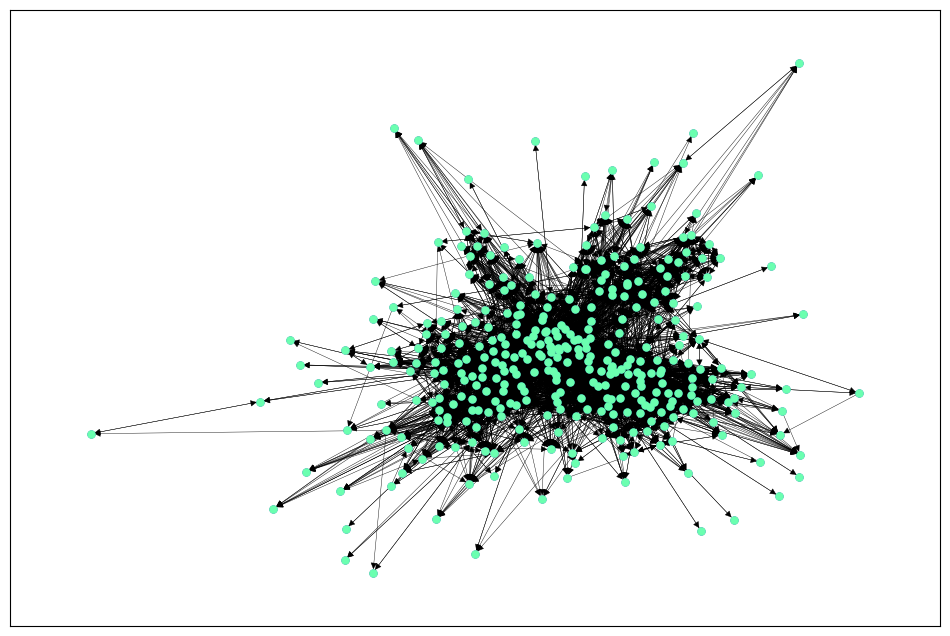

In [59]:
community1_subgraph = DG_strong.subgraph(node_lists_community1)



plt.figure(figsize=(12,8))

pos = nx.spring_layout(community1_subgraph)
nx.draw_networkx(community1_subgraph, pos, width= 0.3, node_size= 25,  with_labels=False)
nx.draw_networkx_nodes(community1_subgraph, pos, node_size= 25, nodelist=node_lists_community1, node_color='#6bffb0') #green
plt.show()


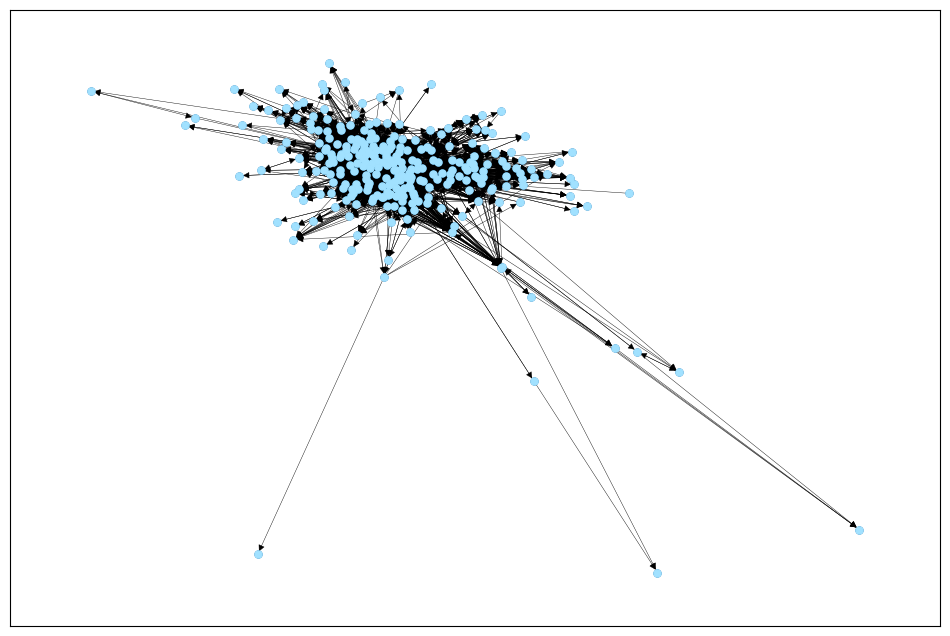

In [82]:
community2_subgraph = DG_strong.subgraph(node_lists_community2)



plt.figure(figsize=(12,8))

pos = nx.spring_layout(community2_subgraph)
nx.draw_networkx(community2_subgraph, pos, width= 0.3, node_size= 25,  with_labels=False)
nx.draw_networkx_nodes(community2_subgraph, pos, node_size= 25, nodelist=node_lists_community2, node_color='#a1e1ff') #blue
plt.show()


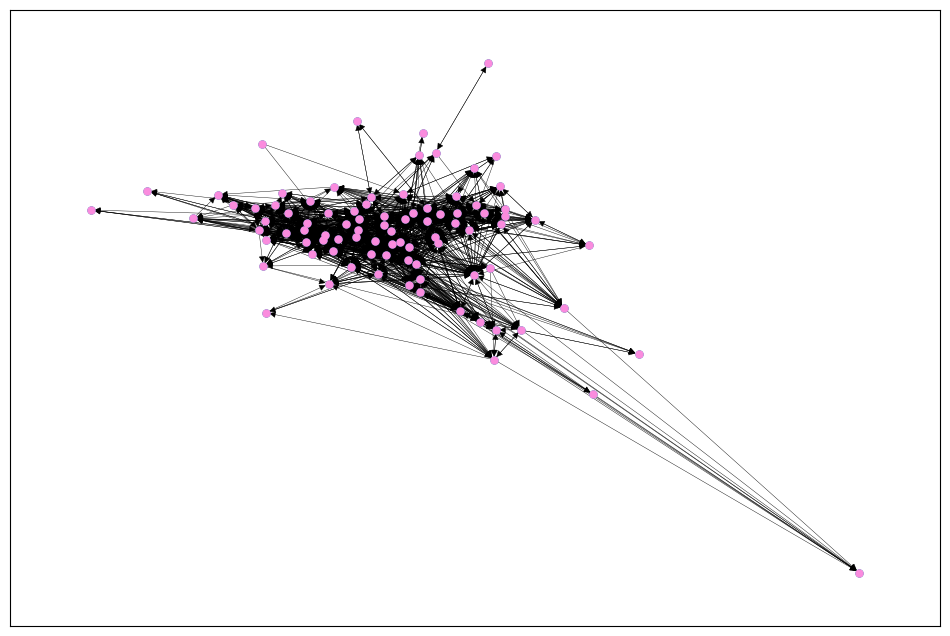

In [78]:
community3_subgraph = DG_strong.subgraph(node_lists_community3)



plt.figure(figsize=(12,8))

pos = nx.spring_layout(community3_subgraph)
nx.draw_networkx(community3_subgraph, pos, width= 0.3, node_size= 25,  with_labels=False)
nx.draw_networkx_nodes(community3_subgraph, pos, node_size= 25, nodelist=node_lists_community3, node_color='#fa8cde') #pink
plt.show()

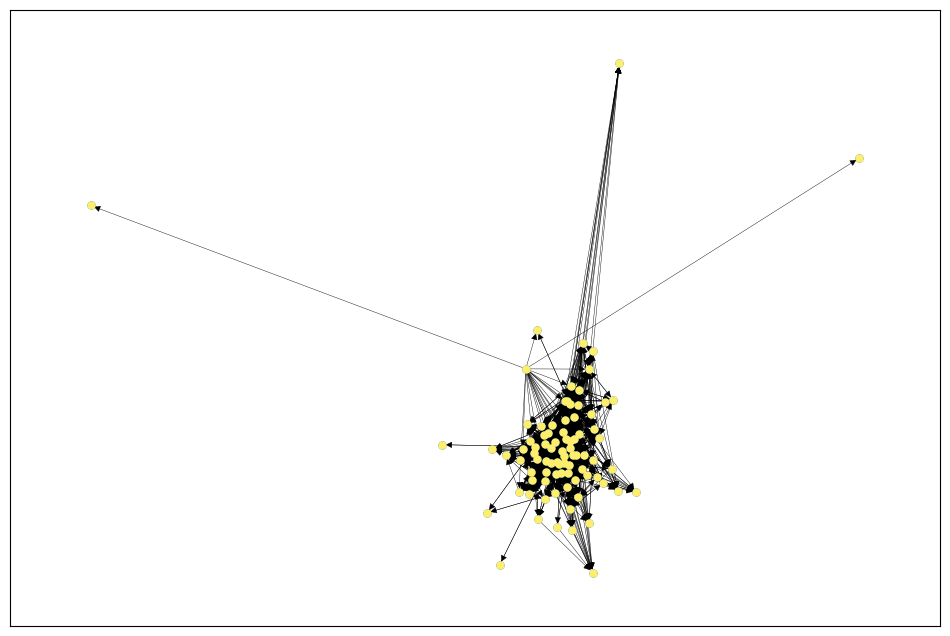

In [81]:
community4_subgraph = DG_strong.subgraph(node_lists_community4)



plt.figure(figsize=(12,8))

pos = nx.spring_layout(community4_subgraph)
nx.draw_networkx(community4_subgraph, pos, width= 0.3, node_size= 25,  with_labels=False)
nx.draw_networkx_nodes(community4_subgraph, pos, node_size= 25, nodelist=node_lists_community4, node_color='#ffee6b') #yellow
plt.show()

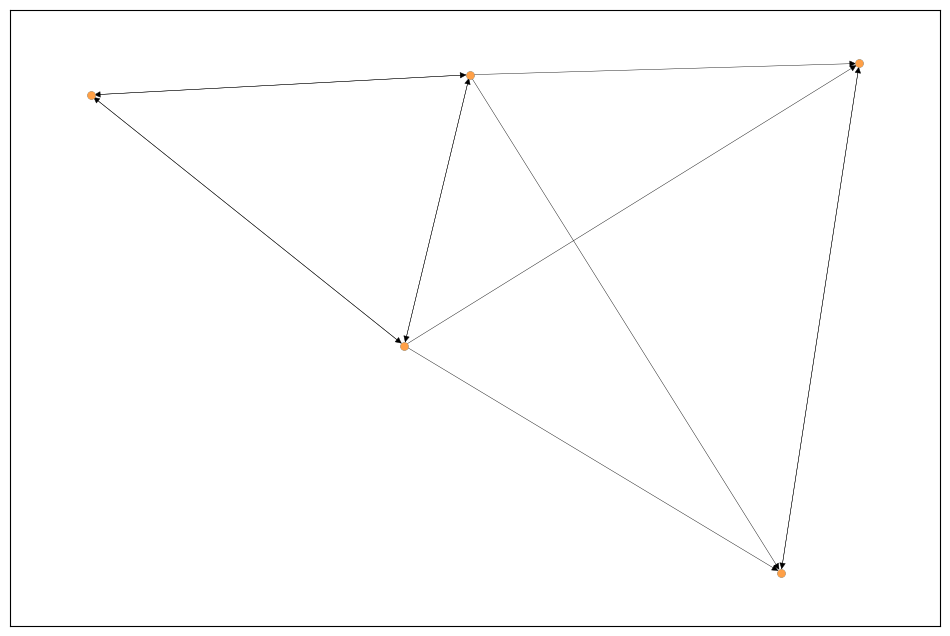

In [68]:
community5_subgraph = DG_strong.subgraph(node_lists_community5)



plt.figure(figsize=(12,8))

pos = nx.spring_layout(community5_subgraph)
nx.draw_networkx(community5_subgraph, pos, width= 0.3, node_size= 25,  with_labels=False)
nx.draw_networkx_nodes(community5_subgraph, pos, node_size= 25, nodelist=node_lists_community5, node_color='#ffa047') #orange
plt.show()